# DSCB310 – Datenanalyse und Business Intelligence 1
----
## Gruppe 3 (67610, 77573, 67641, 77587, 77399)

## Shopping Cart Analyse
---
# 1. Übersicht der Daten und Datenvorverarbeitung

### 1.1 Imports der benötigten Bibliotheken und Einlesen der Datei

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from functools import reduce
from itertools import combinations
from collections import Counter
import json

In [2]:
# Einlesen der Datei in ein pandas DataFrame
shopping_df = pd.read_parquet('shoppingCarts.parquet', engine='fastparquet')

### 1.2 Datenerkundung und Überprüfung der Datenqualität 
Anzahl der zeilen, Spalten, Unique-Werte
NaN-Werte oder Ausreißer finden und ggf.ersetzen/entfernen

In [3]:
shopping_df.head()

,order_id,product_id,add_to_cart_order,reordered,user_id,order_dow,order_hour_of_day,days_since_prior_order,product_name,aisle_id,department_id,department,aisle,county
0,1,17704,3,1,205970,5,17,12.0,Lemons,123,4,produce,packaged vegetables fruits,Ventura
1,1,17461,7,1,205970,5,17,12.0,Air Chilled Organic Boneless Skinless Chicken ...,35,12,meat seafood,poultry counter,Ventura
2,1,46667,6,1,205970,5,17,12.0,Organic Ginger Root,83,4,produce,fresh vegetables,Ventura
3,1,17668,5,1,205970,5,17,12.0,Unsweetened Chocolate Almond Breeze Almond Milk,91,16,dairy eggs,soy lactosefree,Ventura
4,1,33754,1,1,205970,5,17,12.0,Total 2% with Strawberry Lowfat Greek Strained...,120,16,dairy eggs,yogurt,Ventura


In [4]:
# Anzahl der Zeilen und Spalten in Daten
shopping_df.shape

(6145748, 14)

In [5]:
# wie viele eindetuige Werte haben alle Spalten?
# gleichtzetige Überprüfung der Datenqualität mancher Spalten
shopping_df.nunique().to_frame(name='unique values')

,unique values
order_id,604939
product_id,45616
add_to_cart_order,145
reordered,2
user_id,37386
order_dow,7
order_hour_of_day,24
days_since_prior_order,31
product_name,45616
aisle_id,134


In [6]:
# sortierte Liste aller Counties in den Daten
print(sorted(shopping_df['county'].unique()))
# California Counties

['Alameda', 'Alpine', 'Amador', 'Butte', 'Calaveras', 'Colusa', 'Contra Costa', 'Del Norte', 'El Dorado', 'Fresno', 'Glenn', 'Humboldt', 'Imperial', 'Inyo', 'Kern', 'Kings', 'Lake', 'Lassen', 'Los Angeles', 'Madera', 'Marin', 'Mariposa', 'Mendocino', 'Merced', 'Modoc', 'Mono', 'Monterey', 'Napa', 'Nevada', 'Orange', 'Placer', 'Plumas', 'Riverside', 'Sacramento', 'San Benito', 'San Bernardino', 'San Diego', 'San Francisco', 'San Joaquin', 'San Luis Obispo', 'San Mateo', 'Santa Barbara', 'Santa Clara', 'Santa Cruz', 'Shasta', 'Sierra', 'Siskiyou', 'Solano', 'Sonoma', 'Stanislaus', 'Sutter', 'Tehama', 'Trinity', 'Tulare', 'Tuolumne', 'Ventura', 'Yolo', 'Yuba']


In [7]:
# sortierte Liste aller Abteilungen in den Daten
print(sorted(shopping_df['department'].unique()))
# 'missing' Abteilung

['alcohol', 'babies', 'bakery', 'beverages', 'breakfast', 'bulk', 'canned goods', 'dairy eggs', 'deli', 'dry goods pasta', 'frozen', 'household', 'international', 'meat seafood', 'missing', 'other', 'pantry', 'personal care', 'pets', 'produce', 'snacks']


'days_since_prior_order' hat 30 als Max. Es kann sein, dass die Daten aus einem Monat sind.

In [8]:
shopping_df['days_since_prior_order'].unique()

array([12.,  7.,  9.,  8.,  1.,  2.,  5., nan, 30.,  3.,  4.,  0., 25.,
       20.,  6., 21., 14., 22., 17., 10., 27., 11., 19., 13., 15., 16.,
       28., 18., 26., 29., 23., 24.])

Zwischenergebnis

#### 1.2.1 Es wurden insgesamt 6145748 Produkte in 604939 Bestellungen gekauft. Die Bestellungen wurden duch 37386 Users in 58 verschiedenen Counties getätigt.
----

#### 1.2.2 Fehlende Werte (NaN) finden und ggf.ersetzen

In [9]:
# Fehlen irgendwelche Werte in den Daten?
shopping_df.isna().sum()

order_id                       0
product_id                     0
add_to_cart_order              0
reordered                      0
user_id                        0
order_dow                      0
order_hour_of_day              0
days_since_prior_order    376698
product_name                   0
aisle_id                       0
department_id                  0
department                     0
aisle                          0
county                         0
dtype: int64

In [10]:
# die 'nan' Werte in der Spalte days_since_prior_order werden durch -1 ersetzt
shopping_df['days_since_prior_order'] = shopping_df['days_since_prior_order'].fillna(value=-1)

#### 1.2.3 Duplikate in Daten

In [11]:
# Gibt es Duplikate in den Daten?
shopping_df[shopping_df.duplicated()]

,order_id,product_id,add_to_cart_order,reordered,user_id,order_dow,order_hour_of_day,days_since_prior_order,product_name,aisle_id,department_id,department,aisle,county


### 1.3 Datenvorverarbeitung und Feature Engineering

#### 1.3.1 Datentypen der Spalten und Speicheroptimierung

In [12]:
shopping_df.dtypes

order_id                    int32
product_id                  int64
add_to_cart_order           int64
reordered                   int64
user_id                     int64
order_dow                   int64
order_hour_of_day           int64
days_since_prior_order    float64
product_name               object
aisle_id                    int64
department_id               int64
department                 object
aisle                      object
county                     object
dtype: object

In [13]:
# große Datenmenge (2 GB)
(shopping_df.memory_usage(deep=True).sum())/ (10 ** 9)

2.206460942

#### 1.3.2 Ein kleiner Versuch die Größe der Daten zu verkleinern

In [14]:
shopping_df['product_id'] = shopping_df['product_id'].astype('int32')
shopping_df['add_to_cart_order'] = shopping_df['add_to_cart_order'].astype('int16')
shopping_df['reordered'] = shopping_df['reordered'].astype('int16')
shopping_df['user_id'] = shopping_df['user_id'].astype('int32')
shopping_df['order_dow'] = shopping_df['order_dow'].astype('int16')
shopping_df['order_hour_of_day'] = shopping_df['order_hour_of_day'].astype('int32')
shopping_df['days_since_prior_order'] = shopping_df['days_since_prior_order'].astype('int16')
shopping_df['aisle_id'] = shopping_df['aisle_id'].astype('int16')
shopping_df['department_id'] = shopping_df['department_id'].astype('int16')

In [15]:
(shopping_df.memory_usage(deep=True).sum())/ (10 ** 9)

1.911465038

In [16]:
# assert shopping_df['reordered'].nunique() == 2
# assert shopping_df['order_dow'].nunique() == 7
# assert shopping_df['order_hour_of_day'].nunique() == 24

#### 1.3.3 Erstellen einer neuen Spalte, die die Namen der Tage beinhaltet

In [17]:
day_dict = {
    day_num: day
    for day_num, day in enumerate(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
}
shopping_df['day'] = shopping_df['order_dow'].map(day_dict)

#### 1.3.4 FIPS Code für alle Counties
Geo Daten um zu plotten

In [18]:
# FIPS Codes um zu plotten
with open(file = "county_ca.geojson") as data:
    counties_geojson = json.load(data)
    
df_fips = pd.read_csv("california.csv", index_col='county', dtype={"fips": str})

shopping_df['fips'] = shopping_df['county'].map(df_fips.to_dict()['fips'])

#### Global Variables for plots

In [19]:
## Design variables ##
font_color = '#504560'
font = "monospace"
## Design variables ##

# 2. Hauptdatenanalyse
----

## 2.1 Produktübersicht
----

#### 2.1.1 Im kompletten Online Store wurden über diesen Zeitraum 45616 verschiedene Produkte verkauft. Diese Produkte waren in 21 Kategorien unterteilt und waren in 134 verschiedenen Gängen zu finden. !!!!

In [20]:
shopping_df[['product_id','department_id','aisle_id']].nunique()

product_id       45616
department_id       21
aisle_id           134
dtype: int64

#### 2.1.2 Die meist verkauften Produkte im kompletten Online Store

In [21]:
shopping_df.groupby('product_name', as_index=False).agg({
    'order_id':'count',
    'department':'max',
    'aisle':'max'
}).sort_values(by='order_id', ascending=False).head(10).rename(columns={
    'order_id': 'total orders'
}).set_index(pd.Index(list(range(1, 11))))

,product_name,total orders,department,aisle
1,Banana,90369,produce,fresh fruits
2,Bag of Organic Bananas,70552,produce,fresh fruits
3,Organic Strawberries,50847,produce,fresh fruits
4,Organic Baby Spinach,45860,produce,packaged vegetables fruits
5,Organic Hass Avocado,40208,produce,fresh fruits
6,Organic Avocado,33119,produce,fresh fruits
7,Large Lemon,28725,produce,fresh fruits
8,Strawberries,27719,produce,fresh fruits
9,Limes,27022,produce,fresh fruits
10,Organic Raspberries,26106,produce,packaged vegetables fruits


#### 2.1.3 Kategorien in denen die meisten Produkte verkauft wurden

In [22]:
shopping_df.groupby('department', as_index=False)['product_id'].count().sort_values(
    by='product_id', ascending=False
).rename(columns={'product_id':'sold_products'}).head(10).set_index(pd.Index(list(range(1, 11))))

,department,sold_products
1,produce,1796590
2,dairy eggs,1027947
3,snacks,546682
4,beverages,506057
5,frozen,424780
6,pantry,354402
7,bakery,222343
8,canned goods,203549
9,deli,199675
10,dry goods pasta,165053


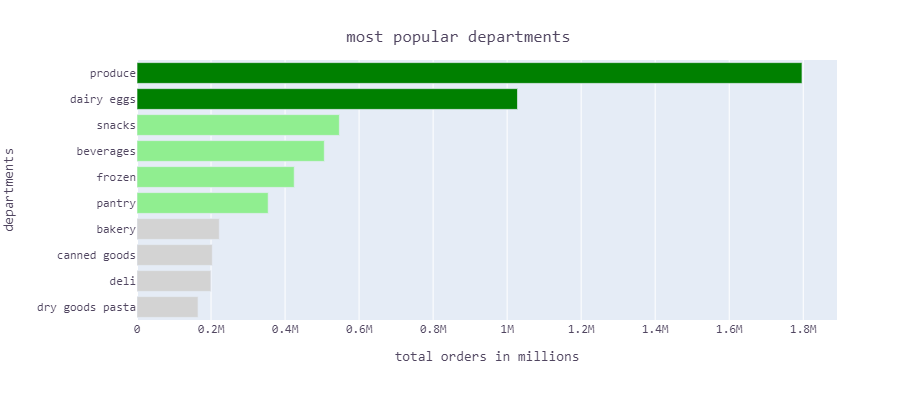

In [23]:
fig = px.bar(
    shopping_df.groupby('department', as_index=False)['product_id'].count().sort_values(
    by='product_id', ascending=False
).rename(columns={'product_id':'sold_products'}).head(10).set_index(pd.Index(list(range(1, 11)))),
    y="department", x="sold_products",color='department',
    color_discrete_sequence=['green']*2+['lightgreen']*4+['lightgrey']*4,
    height=400,labels={
        'department':'departments',
        'sold_products':'total orders in millions',

 }
)

fig.update_layout(
    showlegend = False,
    title={
        'text':'most popular departments',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()

## 2.2 Bestellübersicht
----

#### 2.2.1 Die größten Bestellungen (Bestellungen mit den meisten Produkten)

In [24]:
shopping_df.groupby('order_id',as_index=False).agg({
    'product_id': 'count',
    'user_id': 'max'
}).sort_values(
    by='product_id', ascending=False).rename(
    columns={
        'product_id': 'total products',
        'user_id': 'customer'
    }
).head(10).set_index(pd.Index(list(range(1, 11))))

,order_id,total products,customer
1,276701,145,22906
2,10833,127,22906
3,463838,109,60694
4,378149,108,60694
5,480548,100,60694
6,194674,100,190889
7,45951,99,60694
8,291188,96,60694
9,49547,96,185459
10,119211,96,60694


#### 2.2.2 Gibt es Bestellungen wo ein Produkt mehr als ein Mal vorkommt
Da es keine Spalte 'Menge' verfügbar ist, musste das geprüft werden.

In [25]:
shopping_df.groupby("order_id").agg(
    {
        "product_id" : "nunique", "product_name" : "count"
    }
).query('product_id != product_name')
# Man bekommt ein leeres Dataframe zurück

,product_id,product_name
order_id,,


#### 2.2.3 Die Anzahl der Produkte pro Bestellung

In [26]:
frequencies = shopping_df.groupby('order_id').agg(
        {
            'product_id': 'nunique'
        }
    ).value_counts().to_frame().head(60).sort_index().reset_index()
frequencies.columns = ['order_size', 'count']
frequencies.set_index('order_size', inplace=True, drop=True)
frequencies.head()

,count
order_size,
1,30139
2,35062
3,38898
4,41919
5,42776


In [27]:
# die 62% der Bestellungen haben 10 oder weniger Produkte
(frequencies.head(10).sum()/frequencies.sum()) * 100

count    61.999573
dtype: float64

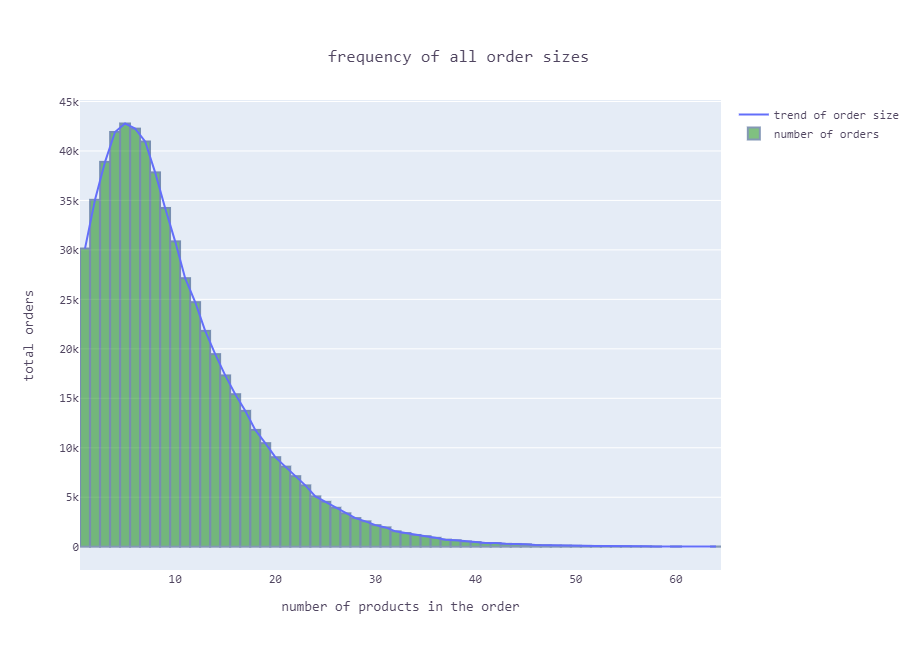

In [28]:
fig = go.Figure()

fig.add_traces(go.Scatter(
    x=frequencies.index, y=frequencies['count'],
    name='trend of order size'
)
              )

fig.add_bar(
    x=frequencies.index, y=frequencies['count'], marker_color='green', opacity=0.5,
    marker_line_color='rgb(8,48,107)', marker_line_width=2,
    name='number of orders'
)
    
fig.update_layout(
    bargap=0.02, width=1050, height=650,title={
        "text": "frequency of all order sizes",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top"
    },
    font={
        'family': font,
         'color': font_color
    },
    xaxis_title="number of products in the order", yaxis_title="total orders"
)
fig.show()

---
###  2.2.F1 Gibt es belastbare Unterschiede im Wiederbestellverhalten zwischen den Produkten mit den product_ids 6217, 14778 und 23579? (Frage 1)

Um zu untersuchen wie sich das Kundenverhalten auf einen Widerkauf der 3 Produkte auswirkt, wurde zu jedem Produkt eine relative Wiederkaufrate berechnet, da es ja sein kann, dass das eine Produkt generell mehr Bestellungen hatte als das andere Produkt und somit würde die Gewichtung keinen Sinn mehr machen.

In [29]:
three_prods_group = shopping_df[shopping_df['product_id'].isin([23579,14778,6217])].groupby('product_id').agg(
    {
        'product_name':'max',
        'order_id':'count',
        'reordered':'sum',  # Summe von allen 1 dabei wird 0 ignoriert
        'county':'nunique', # Zähle mir alle Countys, indem das jeweilige Produkt angeboten/gekauft wird
        'department_id': 'max',
        'aisle_id': 'max'
    }
).sort_values(by='product_id', ascending=False).reset_index()
three_prods_group.rename(columns={
    'order_id': 'total_orders',
    'reordered': 'total_reorders',
    'county': 'bought_in_counties',
}, inplace=True)
three_prods_group['reorder_percentage'] = (
    (three_prods_group['total_reorders']/three_prods_group['total_orders']) * 100
)
three_prods_group.product_id = three_prods_group.product_id.astype(str)
three_prods_group

,product_id,product_name,total_orders,total_reorders,bought_in_counties,department_id,aisle_id,reorder_percentage
0,23579,Peanut Butter Chocolate Chip Fruit & Nut Food Bar,1357,838,44,19,3,61.753869
1,14778,Organic Chocolate Chip Chewy Granola Bars,1329,823,48,19,3,61.926260
2,6217,Pumpkin Spice Protein Bar,46,21,14,19,3,45.652174


#### 2.2.F1.1 (Fig 1) Gegenüberstellung von Anzahl an Bestellungen und und Widerkauf der 3 Protein Bars

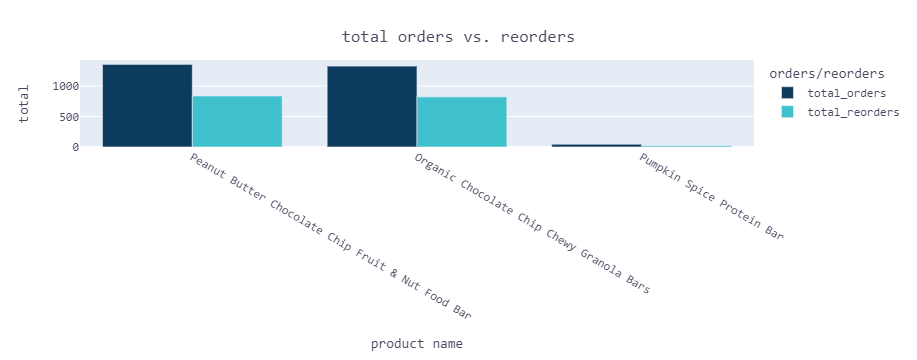

In [30]:
# Defining Custom Colors
colors = {
    "total_orders": "#0C3B5D",
    "total_reorders": "#3EC1CD"

}

fig= px.bar(data_frame=three_prods_group, x='product_name',
       y=['total_orders', 'total_reorders'], barmode='group',
      labels={'product_name': 'product name','value': 'total','variable': 'orders/reorders'},
     color_discrete_map=colors)

fig.update_layout(
    title={
        'text':'total orders vs. reorders',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()

#### 2.2.F1.2 Wiederbestellraten von drei Bars

In [31]:
three_prods_group[['product_name', 'reorder_percentage']].round(2)

,product_name,reorder_percentage
0,Peanut Butter Chocolate Chip Fruit & Nut Food Bar,61.75
1,Organic Chocolate Chip Chewy Granola Bars,61.93
2,Pumpkin Spice Protein Bar,45.65


#### 2.2.F1.3 Untersuchung von Pumpkin Spice Protein Bar
 Zu sehen ist, in wie vielen Countys die drei Produkte gekauft wurden.

In [32]:
three_prods_group[['product_name', 'bought_in_counties']]

,product_name,bought_in_counties
0,Peanut Butter Chocolate Chip Fruit & Nut Food Bar,44
1,Organic Chocolate Chip Chewy Granola Bars,48
2,Pumpkin Spice Protein Bar,14


#### Bestellverhältnis innerhalb der jeweiligen County Gruppe

In [33]:
total_orders_per_county_group = []
# costly for loop
for pid in [23579, 14778, 6217]:
    # gebe mir alle Bestellungen innerhalb der County Gruppe(14,48,44)
    total_orders_per_county_group.append(shopping_df[shopping_df['county'].isin(shopping_df.groupby(
        ['product_id'])['county'].unique()[pid])].groupby('county')['order_id'].nunique().sum())

three_prods_group['total_orders_of_county_group'] = total_orders_per_county_group
three_prods_group['avg. orders per county'] = three_prods_group['total_orders_of_county_group']/three_prods_group['bought_in_counties']
three_prods_group

,product_id,product_name,total_orders,total_reorders,bought_in_counties,department_id,aisle_id,reorder_percentage,total_orders_of_county_group,avg. orders per county
0,23579,Peanut Butter Chocolate Chip Fruit & Nut Food Bar,1357,838,44,19,3,61.753869,576123,13093.704545
1,14778,Organic Chocolate Chip Chewy Granola Bars,1329,823,48,19,3,61.926260,593106,12356.375000
2,6217,Pumpkin Spice Protein Bar,46,21,14,19,3,45.652174,251634,17973.857143


#### Alle bestellungen von Pumpkin Spice Protein Bar pro County

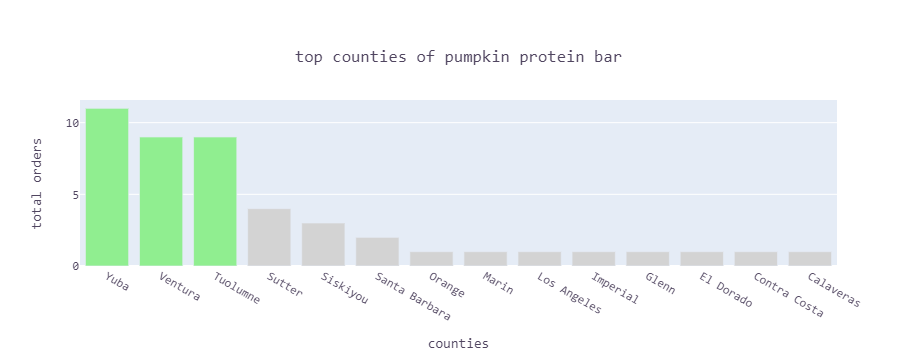

In [34]:
counties_of_pumkin = shopping_df[shopping_df['product_id'] == 6217].groupby('county', as_index=False).agg(
    {
        'order_id': 'count' # es werden alle Bestellungen gezählt
    }
)
# counties_of_pumkin.rename(columns={'order_id': 'total_orders_per_county'})

fig = go.Figure(
    go.Bar(x=counties_of_pumkin.sort_values(by='county', ascending=False)['county'],
           y=counties_of_pumkin.sort_values(by='order_id', ascending=False)['order_id'],
           marker={'color': [
               'lightgreen' if i < 3 else 'lightgrey'
               for i in range(14)
           ]
                  }
          )
)
fig.update_layout(
    xaxis_title='counties',
    yaxis_title='total orders',

    title={
        'text':'top counties of pumpkin protein bar',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()

#### 2.2.F1.4 Alle Protein Bars die sich in der  Kategorie "snacks" befinden

In [35]:
all_orders_normal_bars = shopping_df[(shopping_df['department']=='snacks') & 
            (shopping_df['product_name'].str.contains(r"Bar"))]['product_name'].value_counts().sort_values(
    ascending=False
).sum()

#### Anzahl wie oft ein Protein Bar widergekauft wurde innerhalb der Kategorie

In [36]:
reorders_normal_bars = shopping_df[(shopping_df['department']=='snacks') & 
            (shopping_df['product_name'].str.contains(r"Bar")) & 
           (shopping_df['reordered']==1)]['product_name'].value_counts().sort_values(ascending=False).sum()

#### Reorderrate von allen Protein Bars in der Kategorie "snacks" 

In [37]:
print(reorders_normal_bars/all_orders_normal_bars)

0.5977719556556383


#### Sinn und Zweck dieser Untersuchung
Um genauer untersuchen zu können warum genau der Pumpkin Spice Protein Bar weniger Widergekauft wird und im allgemeinen weniger gekauft wird, haben wir uns für die Kategorie "snacks" jeweils alle "Bars" und alle "Protein Bars" zurückgeben lassen. Anschließend wurde für jede Gruppe also "Bars" und "Protein Bars" eine Reorderrate berechnet, um zu vergleichen ob sich beide "Riegel" (Protein oder nicht) hier unterscheiden. Die Widerkaufrate zwischen Bars und Protein Bars ist fast identisch, also kein bemerkenswerter Unterschied. Dies lässt uns vermuten, dass Pumpkin Protein Bar im allgemeinen ein eher wenig gekaufter Riegel ist.

----

In [38]:
# Diese Funktion wird für verschiedene Aggregationen benutzt
def agg_on_group(group, sort_ascending=False, group_level='product_name'):
    """
    Aggregation function for getting top products/departments from a county.
    It will be applied on all the groups of groupby.
    returns a DataFrame with top products or departments from a county.
    """
    if group_level == 'department':
        return_df_len = 20
    else:
        return_df_len = 45000
    group = group[[group_level]].value_counts().sort_values(
        ascending=sort_ascending
    ).head(return_df_len).to_frame().T
    
    return group  

## 2.3 Regionenanalyse
----

### 2.3.1 Nachfragestärksten und schwächsten Counties

In [39]:
# DF wird nach county gruppiert und pro county soll die order_id gezähl werden.
# Das ergibt die anzahl an verkauften produkten pro couinty
total_products_sold_per_county = shopping_df.groupby("county").agg(
    total_sold_products=pd.NamedAgg(column="order_id",aggfunc="count"),
    fips=pd.NamedAgg(column='fips', aggfunc='max')
)
total_products_sold_per_county.head(2)[['total_sold_products']]

,total_sold_products
county,
Alameda,15985
Alpine,125689


#### 2.3.1.1 Überblick aller Counties

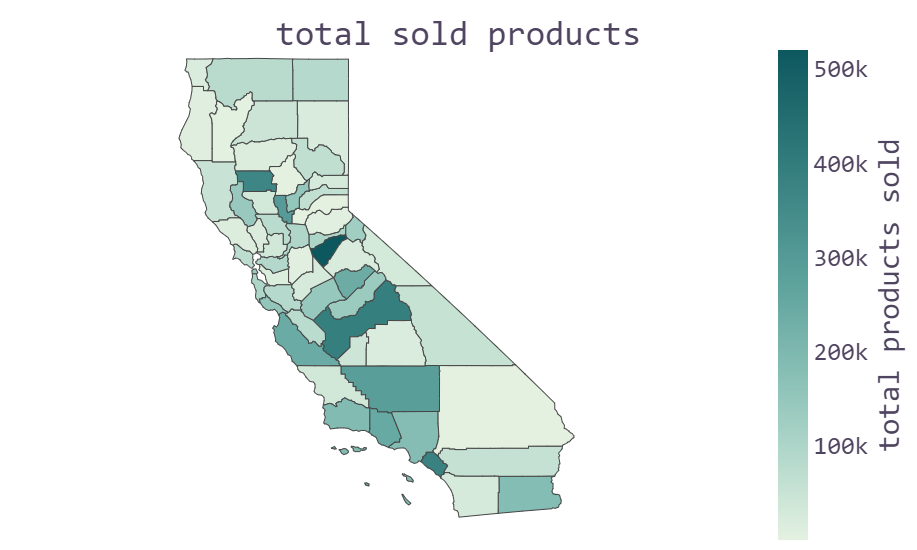

In [40]:
# Gesamtanzahl der verkauften Produkte pro County wird geplotted
fig = px.choropleth(
    total_products_sold_per_county, geojson=counties_geojson, color="total_sold_products",
    color_continuous_scale="mint", locations="fips", featureidkey="properties.GEOID",
    projection="mercator", hover_name=total_products_sold_per_county.index
)
# Darstellungs updates                 
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    width = 800, height = 550, margin={"r":0,"t":40,"l":0,"b":0},font={
        "family" : font, "color" : font_color, "size" : 25
    },
    title = {
        "text" : "total sold products",
        "x" : 0.5,
        "xanchor" :"center",
        "yanchor" : "top"
    }
)
fig.update_coloraxes(
    colorbar_title_text="total products sold" , colorbar_title_side="right", colorbar_ticksuffix=""
)
# Plot Ausgabe
fig.show()

In [41]:
# Gesamtanzahl an Bestellungen pro County. Unique Werte der Order_id gruppiert nach county zählen.
total_orders_per_county = shopping_df.groupby("county").agg(
    total_orders = pd.NamedAgg(column="order_id",aggfunc="nunique"),
    fips=pd.NamedAgg(column='fips', aggfunc='max')
)
total_orders_per_county.head(2)[['total_orders']]

,total_orders
county,
Alameda,3671
Alpine,9410


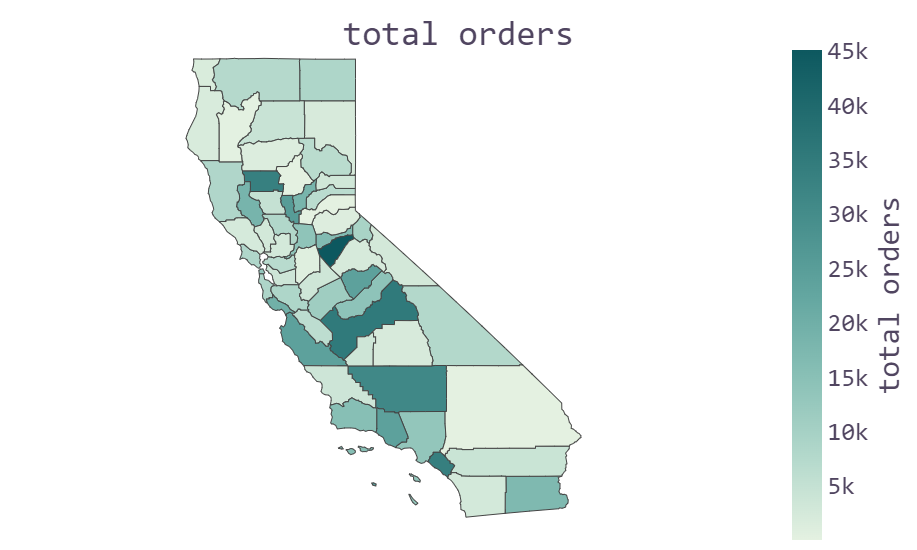

In [42]:
# Gesamtanzahl der Orders pro County wird geplotted
fig = px.choropleth(
    total_orders_per_county, geojson=counties_geojson, color="total_orders",
    color_continuous_scale="mint", locations="fips", featureidkey="properties.GEOID",
    projection="mercator", hover_name=total_orders_per_county.index
)
                    
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    width = 800, height = 550, margin={"r":0,"t":40,"l":0,"b":0},
    font = {"family" : font, "color" : font_color, "size" : 25},
    title = {"text" : "total orders", "x" : 0.5, "xanchor" : "center", "yanchor" : "top"})
fig.update_coloraxes(colorbar_title_text="total orders" , colorbar_title_side = "right", colorbar_ticksuffix="")
fig.show()

#### 2.3.1.2 Top 10 Counties (Anzahl verkaufter Produkte)

In [43]:
# Top 10 counties anhand der verkauften Produkt Anzahl 
total_products_sold_per_county.sort_values('total_sold_products', ascending=False).head(10)[['total_sold_products']]

,total_sold_products
county,
Calaveras,519628
Fresno,391320
Orange,380653
Glenn,364949
Sutter,296980
Kern,287935
Ventura,249972
Monterey,241973
Mariposa,240044


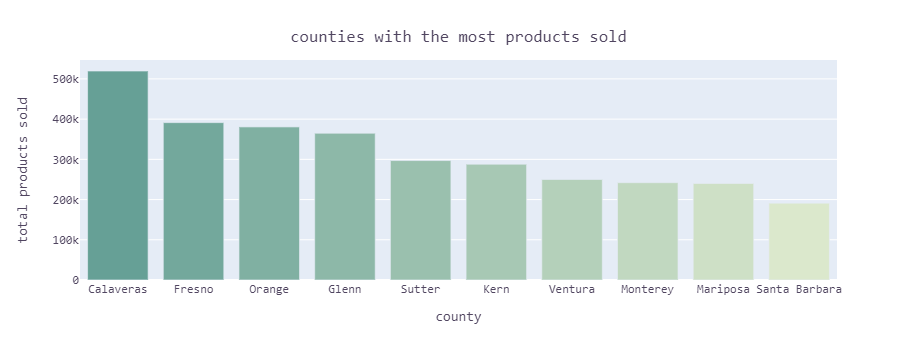

In [44]:
# RGB Werte werden initiiert
r, g, b = 102, 160 , 150
cols = []

# Farbverlauf erstellen
for _ in range(10):
    cols.append(f'rgb({r}, {g}, {b})')
    r += 13
    g += 8
    b += 6
    
# Plot wird erstellt
fig = px.bar(
    total_products_sold_per_county.sort_values('total_sold_products', ascending=False).head(10).reset_index(),
    x='county',
    y="total_sold_products", color='county',
    color_discrete_sequence=cols, labels={
        'total_sold_products': 'total products sold',
    }
)

fig.update_layout(
    showlegend=False,
    title={
        "text": "counties with the most products sold",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top"
    },
    font={
        'family': font,
         'color': font_color
    },
)
fig.show()

#### 2.3.1.3 Top 10 Counties (Anzahl Bestellungen)

In [45]:
total_orders_per_county.sort_values('total_orders', ascending=False).head(10)[['total_orders']]

,total_orders
county,
Calaveras,45045
Fresno,35263
Orange,33902
Glenn,33517
Kern,31088
Sutter,25452
Mariposa,23973
Ventura,23962
Monterey,23898


#### 2.3.1.4 Die schlechtesten 10 Counties (Anzahl verkaufter Produkte)

In [46]:
total_products_sold_per_county.sort_values('total_sold_products').head(10)[['total_sold_products']]

,total_sold_products
county,
Butte,4
Placer,162
San Bernardino,366
Trinity,996
El Dorado,7092
San Joaquin,7397
Humboldt,9294
Sonoma,14185
Tehama,14629


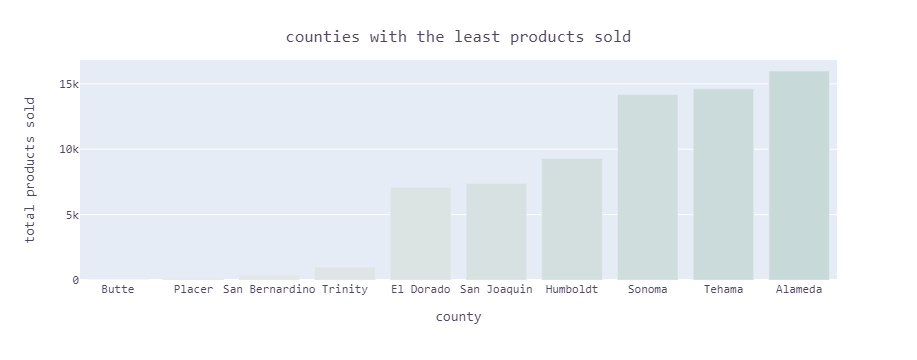

In [47]:
r, g, b = 235, 235, 235
cols = []
for _ in range(10):
    cols.append(f'rgb({r}, {g}, {b})')
    r -= 4
    g -= 2
    b -= 2
    
fig = px.bar(
    total_products_sold_per_county.sort_values('total_sold_products').head(10).reset_index(),
    x='county',
    y="total_sold_products", color='county',
    color_discrete_sequence=cols, labels={
        'total_sold_products': 'total products sold',
    }
)

fig.update_layout(
    showlegend=False,
    title={
        "text": "counties with the least products sold",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top"
    },
    font={
        'family': font,
         'color': font_color
    },
)
fig.show()

#### 2.3.1.5 Die schlechtesten 10 Counties (Anzahl Bestellungen)

In [48]:
total_orders_per_county.sort_values('total_orders').head(10)[['total_orders']]

,total_orders
county,
Butte,3
Placer,33
San Bernardino,79
Trinity,109
San Joaquin,743
El Dorado,1107
Tehama,1190
Del Norte,1680
Humboldt,1951


#### 2.3.1.6 Durchschnitt der verkauften Produkte über alle Counties

In [49]:
round(shopping_df.shape[0]/58, 2)

105961.17

#### 2.3.1.6 Durchschnitt der Bestellungen über alle Counties

In [50]:
round(shopping_df['order_id'].nunique()/58, 2)

10429.98

###  2.3.F2  die Popularität von Produkt 9390 zwischen den Regionen

Hier wird eine Liste erstellt die vier Tabellen enthält.  
Diese Tabellen enthalten alle Werte die zur Berechnung des Popularitätswertes gebraucht werden.

In [51]:
#Produkt ids der Produkte, die in Aufgabe 2 und 3 untersucht werden. 
popular_values = shopping_df.loc[shopping_df["product_id"] == 9390].groupby("county").agg(
    pid_9390_orders=pd.NamedAgg(column="order_id", aggfunc="nunique"),
    pid_9390_users=pd.NamedAgg(column="user_id", aggfunc="nunique")
    # fips=pd.NamedAgg(column='fips', aggfunc='max')
)

popular_values["total_users_per_county"] = shopping_df.groupby("county")["user_id"].nunique()
# Berechnung der durchschnittlichen Bestellmenge pro User und des relativen Anteils der
# gesamten User im County, die das Produkt gekauft haben. 
popular_values["relative_users"] = (
    popular_values["total_users_per_county"]/popular_values["total_users_per_county"].sum()
)

popular_values["mean_bought"] = (
    popular_values["pid_9390_orders"]/popular_values["pid_9390_users"]
)

# Spalte die zum Plotten benötigt wird, wird hinzugefügt
popular_values = popular_values.merge(
    df_fips, how="outer", on="county"
).fillna(0)

# Normalisierung der Werte, die im vorherigen schritt berechnet wurden.
popular_values["normalized_users"] =  (
    popular_values["relative_users"] - popular_values["relative_users"].min())/(
    popular_values["relative_users"].max() - popular_values["relative_users"].min()
)
popular_values["normalized_mean_bought"] =  (
    popular_values["mean_bought"] - popular_values["mean_bought"].min())/(
    popular_values["mean_bought"].max() - popular_values["mean_bought"].min()
)
# Popularity wird Berechnet
# popularity = (normalized_users*0.7) + (normalized_mean_bought*0.3)
popular_values["popularity"] = (
    popular_values.loc[:,"normalized_users"]*0.7) + (
    popular_values.loc[:,"normalized_mean_bought"]*0.3)
popular_values.head()

,pid_9390_orders,pid_9390_users,total_users_per_county,relative_users,mean_bought,fips,normalized_users,normalized_mean_bought,popularity
county,,,,,,,,,
Alameda,1.0,1.0,419.0,0.011419,1.000000,06001,0.190368,0.230769,0.202488
Alpine,15.0,10.0,316.0,0.008612,1.500000,06003,0.143571,0.346154,0.204346
Amador,4.0,4.0,1430.0,0.038973,1.000000,06005,0.649705,0.230769,0.524024
Calaveras,92.0,38.0,2201.0,0.059986,2.421053,06009,1.000000,0.558704,0.867611
Colusa,4.0,4.0,461.0,0.012564,1.000000,06011,0.209450,0.230769,0.215846


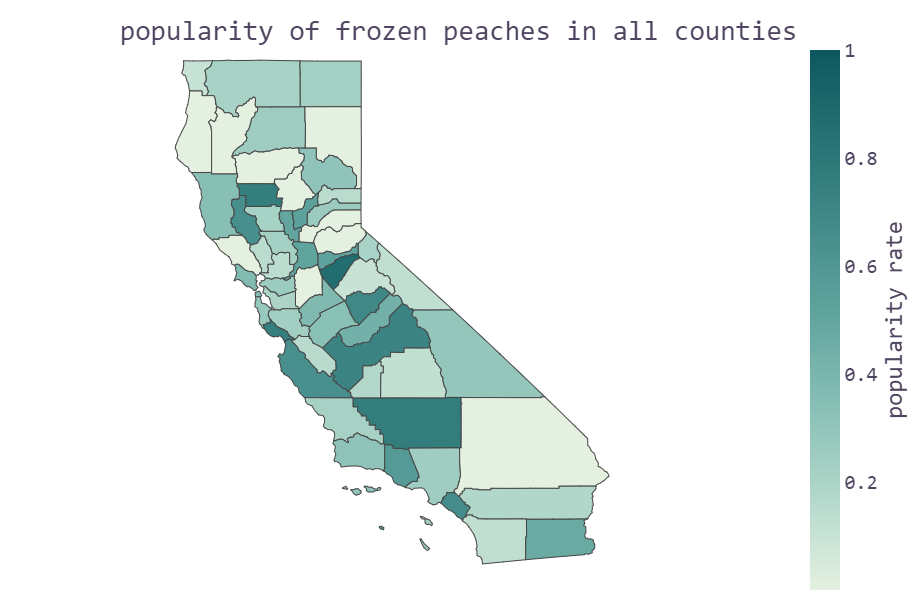

In [52]:
# Ein Kartendiagramm wird für das Produkt 9390 (frozen peaches) erstellt
fig = px.choropleth(
    popular_values.reset_index(), geojson=counties_geojson, color=popular_values["popularity"],
    color_continuous_scale="mint", locations="fips",
    featureidkey="properties.GEOID", projection="mercator",
    hover_name='county',
    range_color = [0,1]
)
            
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    width=950, height=600,
    margin={"r":0,"t":40,"l":0,"b":0},
    font={
        "family": font, "color": font_color, "size": 20
    },
    title = {
        "text" : "popularity of frozen peaches in all counties",
        "x" : 0.5, "xanchor" : "center", "yanchor" : "top"
    }
)

fig.update_coloraxes(
    colorbar_title_text="popularity rate", colorbar_title_side = "right",
    colorbar_ticksuffix=""
)
fig.show()

###  2.3.F3 Sind die Produkte 9390, 2713, 21883 und 16753 in den gleichen Regionen populär und unpopulär, oder unterscheiden sich die Muster?
----
#### 2.3.F3.1 Hier wird eine Liste erstellt die vier Tabellen enthält.  
Diese Tabellen enthalten alle Werte die zur Berechnung des Popularitätswertes gebraucht werden.

In [53]:
ids = [9390, 2713, 21883, 16753]
popular_values_f3 = []
for id in ids:   
    popular_values_f3.append(shopping_df.loc[shopping_df["product_id"] == id].groupby("county").agg(
        {
            "order_id" : "nunique", "user_id" : "nunique"
        }
    ))
    current_df = popular_values_f3[ids.index(id)]
    current_df.rename(columns = {"order_id" : f"pid_{id}_orders", "user_id" : f"pid_{id}_users"}, inplace = True)
    current_df["total_users_per_county"] = shopping_df.groupby("county")["user_id"].nunique()
    current_df["relative_users"] = (current_df["total_users_per_county"]/current_df["total_users_per_county"].sum())
    current_df["mean_bought"] = (current_df[f"pid_{id}_orders"]/current_df[f"pid_{id}_users"])
    current_df = current_df.merge(df_fips.reset_index(), how="outer", on="county").fillna(0)
    current_df["normalized_users"] =  (
        current_df["relative_users"] - current_df["relative_users"].min())/(
        current_df["relative_users"].max() - current_df["relative_users"].min()
    )
    current_df["normalized_mean_bought"] =  (
        current_df["mean_bought"] - current_df["mean_bought"].min())/(
        current_df["mean_bought"].max() - current_df["mean_bought"].min()
    )
    current_df[f"{id} popularity"] = (current_df.loc[:,"normalized_users"]*0.7) + (
        current_df.loc[:,"normalized_mean_bought"]*0.3
    )
    popular_values_f3[ids.index(id)] = current_df
    
popular_values_f3[0].head(3)

,county,pid_9390_orders,pid_9390_users,total_users_per_county,relative_users,mean_bought,fips,normalized_users,normalized_mean_bought,9390 popularity
0,Alameda,1.0,1.0,419.0,0.011419,1.0,06001,0.190368,0.230769,0.202488
1,Alpine,15.0,10.0,316.0,0.008612,1.5,06003,0.143571,0.346154,0.204346
2,Amador,4.0,4.0,1430.0,0.038973,1.0,06005,0.649705,0.230769,0.524024


#### 2.3.F3.2 Plots
Hier werden mit Hilfe einer Schleife vier Kartendiagramme erstellt.  
Pro Produkt ein Kartendiagramm, welches die Popularität pro county darstellt

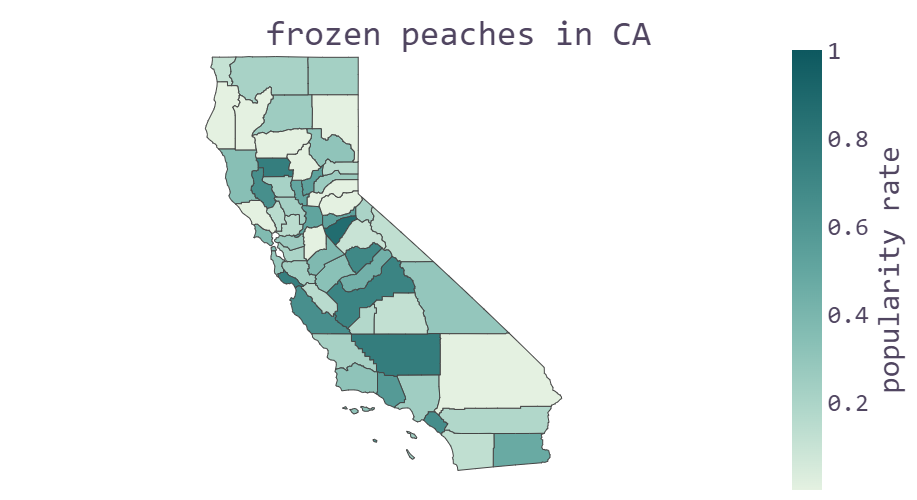

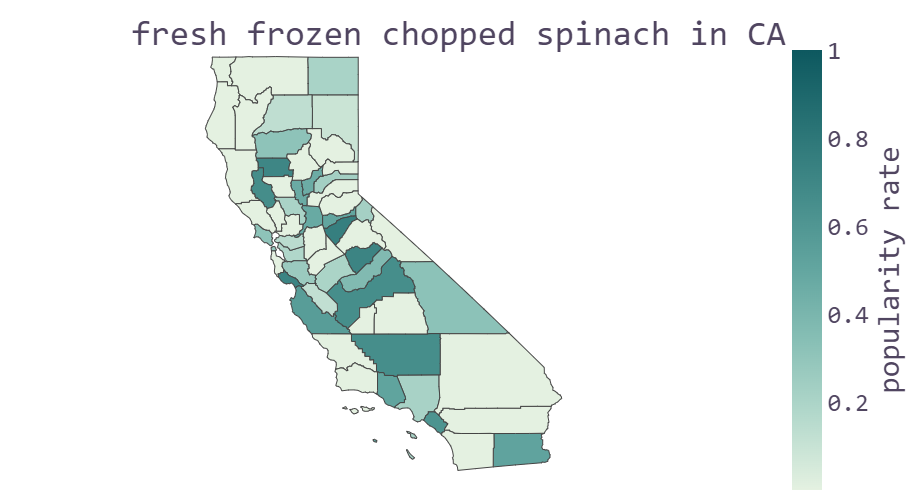

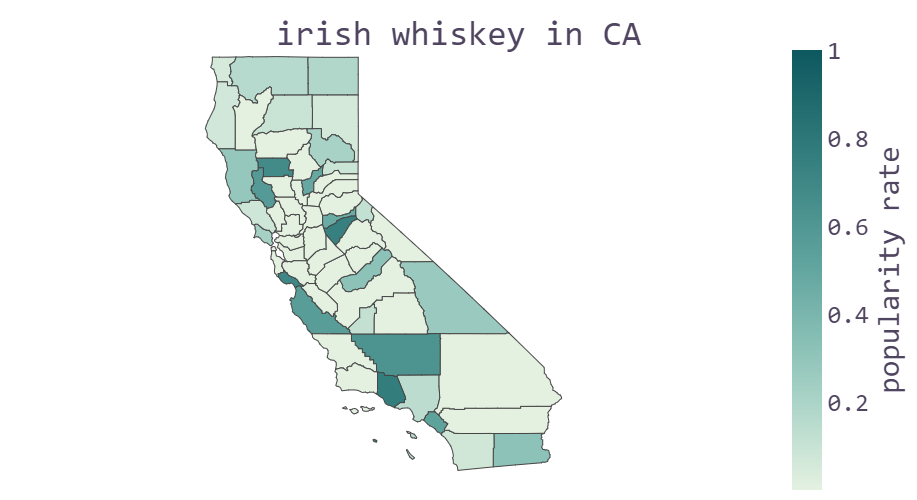

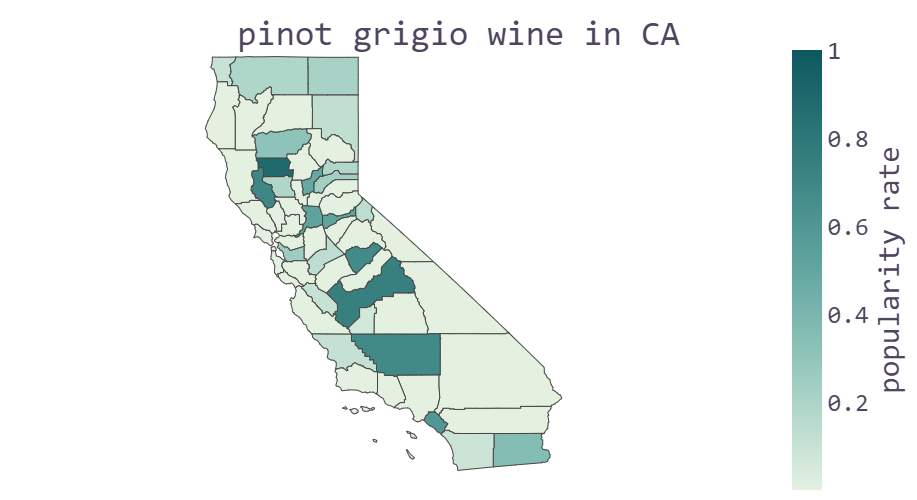

In [54]:
products = ["frozen peaches", "fresh frozen chopped spinach", "irish whiskey", "pinot grigio wine"]
for x in range(4):
   fig = px.choropleth(
       popular_values_f3[x], geojson=counties_geojson, color=popular_values_f3[x].columns[-1]
       ,color_continuous_scale="mint",
       locations="fips", featureidkey="properties.GEOID",
       projection="mercator",
       hover_name="county",
       range_color=[0,1]
    )
                     
   fig.update_geos(fitbounds="locations", visible=False)
   fig.update_layout(
       width = 830, height = 500, margin={"r":0,"t":40,"l":0,"b":0},
       font = {"family": font, "color": font_color, "size": 25},
       title = {"text": f"{products[x]} in CA", "x": 0.5, "xanchor": "center", "yanchor": "top"}
   )
    
   fig.update_coloraxes(colorbar_title_text="popularity rate" , colorbar_title_side="right", colorbar_ticksuffix="")
   fig.show()

## 2.3.F3.3 Heatmap
Hier wird Überprüft, wie sehr sich die Produkte in Popularität und Unpopularität Überschneiden.  
Der errechnete Populationswert pro Produkt wird auf Korrelation mit den Populationswerten der anderen Produkte überprüft. 

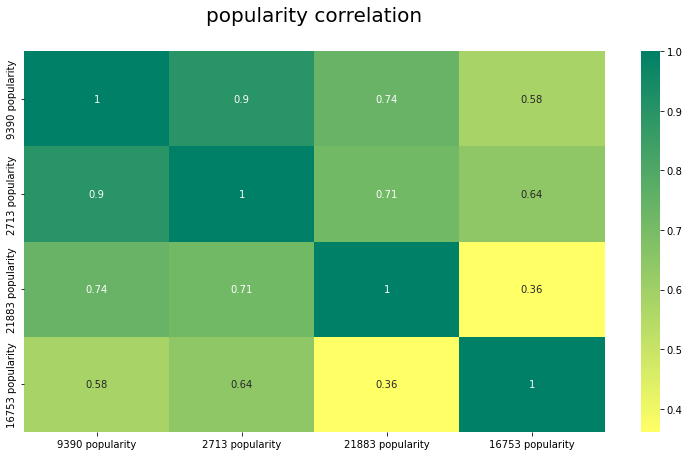

In [55]:
df_merge1 = pd.merge(
    popular_values_f3[0][["county", popular_values_f3[0].columns[-1]]],
    popular_values_f3[1][["county", popular_values_f3[1].columns[-1]]],
    how="outer", on = "county"
)
df_merge2 = pd.merge(
    popular_values_f3[2][["county", popular_values_f3[2].columns[-1]]],
    popular_values_f3[3][["county", popular_values_f3[3].columns[-1]]],
    how="outer", on = "county"
)
# popular_values_f3[0]
df_merge1
df_merge2
df_merge = pd.merge(df_merge1,df_merge2, on = "county", how="outer")
df_merge.set_index("county")
fig = plt.figure(figsize=(13, 7))
ax = plt.axes()
sns.heatmap(df_merge.corr(), ax = ax, annot=True, cmap="summer_r")
plt.title("popularity correlation", fontsize = 20, pad = 30)
plt.show()

----
## 2.4 Detailierte Produktenanalyse
----
### 2.4.F4 Ähnliche Counties im Hinblick auf den Produktmix

In [56]:
from sklearn.cluster import KMeans

#### 2.4.F4.1 Die Anzahl der gekauften Produkte von jeder County werden herausgefunden und zusammen in eine Tabelle gespeichert
Die Daten werden nach Counties groupiert und dann wird für jede County die Anzahl der verkauften Produkte gezählt (für alle Produkte).
Eine Zeile ist eine County

In [57]:
# eine County ist eine Gruppe und die Funktion gibt alle gekaufte Produkte von jeder Gruppe zurück
top_prods_per_county = shopping_df.groupby('county').apply(
    agg_on_group, sort_ascending=False
)

In [58]:
# multiindex 'product_name' wird entfernt
top_prods_per_county.index = top_prods_per_county.index.droplevel(level=1)
# multicolumn wird verbessert
top_prods_per_county.columns = top_prods_per_county.columns.map(''.join)
# Wenn ein Produkt in einer County nicht gekauft wurde, dann soll es da eine Null stehen
top_prods_per_county.fillna(value=0, inplace=True)
top_prods_per_county.head()

,#2 Coffee Filters,#2 Cone White Coffee Filters,#2 Mechanical Pencils,#4 Natural Brown Coffee Filters,& Go! Hazelnut Spread + Pretzel Sticks,(70% Juice!) Mountain Raspberry Juice Squeeze,+Energy Black Cherry Vegetable & Fruit Juice,".5\"" Waterproof Tape",0 Calorie Acai Raspberry Water Beverage,0 Calorie Fuji Apple Pear Water Beverage,...,with Sweet Cinnamon Bunches Cereal,with Twist Ties Sandwich & Storage Bags,with Xylitol Cinnamon 18 Sticks Sugar Free Gum,with Xylitol Island Berry Lime 18 Sticks Sugar Free Gum,with Xylitol Original Flavor 18 Sticks Sugar Free Gum,with Xylitol Unwrapped Original Flavor 50 Sticks Sugar Free Gum,with Xylitol Unwrapped Spearmint 50 Sticks Sugar Free Gum,with Xylitol Watermelon Twist 18 Sticks Sugar Free Gum,with a Splash of Mango Coconut Water,with a Splash of Pineapple Coconut Water
county,,,,,,,,,,,,,,,,,,,,,
Alameda,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Alpine,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Amador,4.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Butte,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Calaveras,9.0,0.0,1.0,5.0,3.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


#### 2.4.F4.2 Ein Cluster Algorithm um Regionen zu groupieren, die einen ähnlichen Productmix haben
Die Counties, die einen ähnlichen Produktmix haben werden zusammen groupiert. Dafür wird geschaut in welchen Counties ähnliche gemeinsame Produkte vorkommen und die Anzahl auch einigermaßen ähnlich ist. Die unbeliebten Produkte spielen auch eine wichtige Rolle bei der Auswahl.

In [59]:
prods_X = top_prods_per_county.values
inertia = []

# hier wird die passende Anzahl der Gruppen gefunden

for num_clusters in range(3, 12):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans = kmeans.fit(prods_X)
    inrt = kmeans.inertia_
    inertia.append(inrt)
    # print(f'for {num_clusters} the inertia is: {inrt}')


In [60]:
# sns.lineplot(x=range(3, len(inertia)+3), y=inertia)

In [61]:
# jeder County wird eine Gruppe zugeordnet
kmeans = KMeans(n_clusters=6, random_state=42)
kmeans = kmeans.fit(prods_X)

top_prods_per_county['label'] = kmeans.labels_
top_prods_per_county['group'] = top_prods_per_county['label'].map(
    {
        indx: group_letter
        for indx, group_letter in enumerate(['a', 'b', 'c', 'd', 'e', 'f'])
})
top_prods_per_county.head()

,#2 Coffee Filters,#2 Cone White Coffee Filters,#2 Mechanical Pencils,#4 Natural Brown Coffee Filters,& Go! Hazelnut Spread + Pretzel Sticks,(70% Juice!) Mountain Raspberry Juice Squeeze,+Energy Black Cherry Vegetable & Fruit Juice,".5\"" Waterproof Tape",0 Calorie Acai Raspberry Water Beverage,0 Calorie Fuji Apple Pear Water Beverage,...,with Xylitol Cinnamon 18 Sticks Sugar Free Gum,with Xylitol Island Berry Lime 18 Sticks Sugar Free Gum,with Xylitol Original Flavor 18 Sticks Sugar Free Gum,with Xylitol Unwrapped Original Flavor 50 Sticks Sugar Free Gum,with Xylitol Unwrapped Spearmint 50 Sticks Sugar Free Gum,with Xylitol Watermelon Twist 18 Sticks Sugar Free Gum,with a Splash of Mango Coconut Water,with a Splash of Pineapple Coconut Water,label,group
county,,,,,,,,,,,,,,,,,,,,,
Alameda,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,c
Alpine,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,a
Amador,4.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,a
Butte,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,c
Calaveras,9.0,0.0,1.0,5.0,3.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,b


#### 2.4.F4.3 Alle County-Gruppen werden auf der Karte visualisiert, so dass man sich eine gute Überblick aller Gruppen verschaffen kann

In [62]:
top_prods_per_county = top_prods_per_county.reset_index()
top_prods_per_county['fips'] = top_prods_per_county['county'].map(df_fips.to_dict()['fips'])

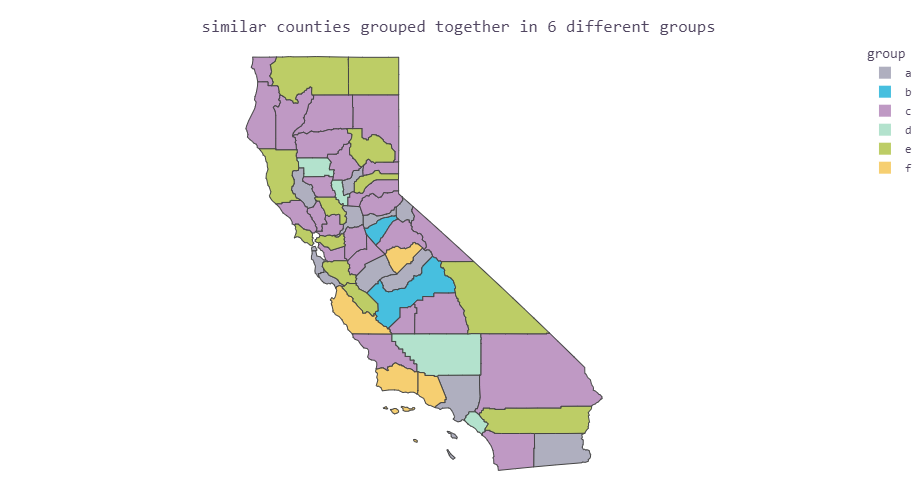

In [63]:
fig = px.choropleth(
    top_prods_per_county, geojson=counties_geojson, color="group", category_orders={
        'group': ['a', 'b', 'c', 'd', 'e', 'f']
    },
    color_discrete_map={
        'a': '#afafbf',
        'b': '#47bfdf',
        'c': '#bf99c4',
        'd': px.colors.qualitative.Pastel2[0],
        'e': '#bdcd66',
        'f': px.colors.qualitative.Pastel[1]
    },
    locations="fips", featureidkey="properties.GEOID",
    projection="mercator",
    hover_data=['county', 'group']
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    width=800, height=500, margin={
        "r": 0, "t": 40, "l": 0 ,"b" :0
    },
    title={
        'text':'similar counties grouped together in 6 different groups',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()

#### 2.4.F4.4 Alle Gruppen mit Counties von dieser Gruppe werden in Form einer Tabelle dargestellt

In [64]:
top_prods_per_county[top_prods_per_county['group'] == 'a'][['county', 'group']].reset_index(drop=True)

,county,group
0,Alpine,a
1,Amador,a
2,Imperial,a
3,Lake,a
4,Los Angeles,a
5,Madera,a
6,Merced,a
7,Sacramento,a
8,San Francisco,a
9,San Mateo,a


In [65]:
top_prods_per_county[top_prods_per_county['group'] == 'b'][['county', 'group']].reset_index(drop=True)

,county,group
0,Calaveras,b
1,Fresno,b


In [66]:
top_prods_per_county[top_prods_per_county['group'] == 'c'][['county', 'group']].reset_index(drop=True)

,county,group
0,Alameda,c
1,Butte,c
2,Colusa,c
3,Del Norte,c
4,El Dorado,c
5,Humboldt,c
6,Kings,c
7,Lassen,c
8,Mono,c
9,Napa,c


In [67]:
top_prods_per_county[top_prods_per_county['group'] == 'd'][['county', 'group']].reset_index(drop=True)

,county,group
0,Glenn,d
1,Kern,d
2,Orange,d
3,Sutter,d


In [68]:
top_prods_per_county[top_prods_per_county['group'] == 'e'][['county', 'group']].reset_index(drop=True)

,county,group
0,Contra Costa,e
1,Inyo,e
2,Marin,e
3,Mendocino,e
4,Modoc,e
5,Nevada,e
6,Plumas,e
7,Riverside,e
8,San Benito,e
9,Santa Clara,e


In [69]:
top_prods_per_county[top_prods_per_county['group'] == 'f'][['county', 'group']].reset_index(drop=True)

,county,group
0,Mariposa,f
1,Monterey,f
2,Santa Barbara,f
3,Ventura,f


#### 2.4.F4.5 Da wir jetzt wissen welche Counties ähnlichen Verlauf der Bestellungen haben, werden die Korrelationen zwischen Counties berechnet und durch ein Heatmap dargestellt.
Für eine bessere graphische Darstellung werden wir nur die Korrelationen zwischen Counties der Gruppen a und f zeigen.
Die Counties haben allgemein sehr starke Korralation, das könnte daran liegen, dass die meist verkauften Produkte über alle
Counties sehr ähnlich sind. Oder, dass es viele Produkte gibt, die in vielen Counties gar nicht verkauft wurden.

In [70]:
top_prods_per_county = top_prods_per_county[top_prods_per_county['group'].isin(['a', 'f'])]
top_prods_per_county = top_prods_per_county.set_index('county', drop=True)
top_prods_per_county = top_prods_per_county.drop(['fips', 'label', 'group'], axis=1)

In [71]:
county_corr = top_prods_per_county.T.corr().abs() # Korrelation zwischen Counties
county_corr.head()

county,Alpine,Amador,Imperial,Lake,Los Angeles,Madera,Mariposa,Merced,Monterey,Sacramento,San Francisco,San Mateo,Santa Barbara,Santa Cruz,Ventura,Yuba
county,,,,,,,,,,,,,,,,
Alpine,1.000000,0.855450,0.928301,0.906188,0.941553,0.918363,0.929805,0.933213,0.943252,0.884380,0.924834,0.892365,0.933555,0.912348,0.940834,0.819268
Amador,0.855450,1.000000,0.900563,0.924473,0.857255,0.910904,0.908137,0.865608,0.906072,0.949939,0.874944,0.834446,0.870212,0.942877,0.907928,0.887243
Imperial,0.928301,0.900563,1.000000,0.946071,0.928941,0.941581,0.958554,0.935047,0.953876,0.919731,0.929232,0.870449,0.919822,0.942093,0.951052,0.865460
Lake,0.906188,0.924473,0.946071,1.000000,0.902642,0.939813,0.957277,0.905703,0.948763,0.934781,0.922939,0.868606,0.912949,0.950211,0.937964,0.869229
Los Angeles,0.941553,0.857255,0.928941,0.902642,1.000000,0.923811,0.924946,0.949814,0.951182,0.897179,0.932767,0.919800,0.953755,0.923841,0.951086,0.809917


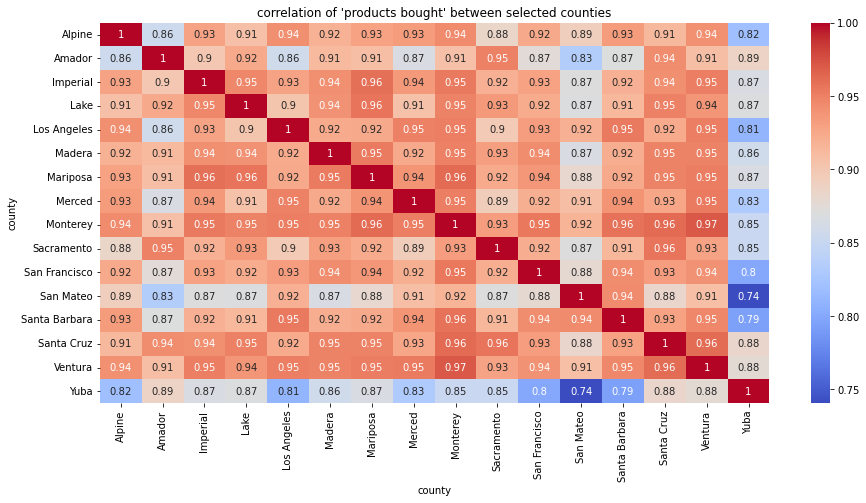

In [72]:
plt.figure(figsize=(15, 7))
sns.heatmap(county_corr, annot=True, cmap="coolwarm")
plt.title("correlation of 'products bought' between selected counties")
plt.show()

#### 2.4.F4.6 Bei Produkten gibt es allgemein eine gute Korrelation zwischen Counties, im nächsten Schritt wird analysiert, wie die Realtionen zwischen Counties auf der 'Department-Ebene' sind.
Wie bei Produkten wird hier auch für jede County die Anzahl der verkauften Produkte in allen Abteilungen gefunden und in eine Tabelle gespeichert. Eine Zeile hat die Informationen über eine County und die verkauften Produkte in allen Abteilungen in dieser County

In [73]:
# top departments per county
# Es werden nicht alle Counties gewählt
counties = ['Calaveras', 'Fresno', 'Glenn', 'Imperial', 'Kern', 'Lake',
            'Los Angeles', 'Madera', 'Mariposa', 'Orange', 'San Francisco',
            'Santa Barbara', 'Santa Cruz', 'Sutter', 'Ventura', 'Shasta', 'San Bernardino']

top_deps_per_county = shopping_df[shopping_df['county'].isin(counties)].groupby('county').apply(
    agg_on_group, sort_ascending=False, group_level='department'
)
top_deps_per_county.index = top_deps_per_county.index.droplevel(level=1)
top_deps_per_county.head()

department,alcohol,babies,bakery,beverages,breakfast,bulk,canned goods,dairy eggs,deli,dry goods pasta,...,household,international,meat seafood,missing,other,pantry,personal care,pets,produce,snacks
county,,,,,,,,,,,,,,,,,,,,,
Calaveras,409.0,7192.0,19989,41760,10765.0,453.0,19197.0,88473,19688.0,9177.0,...,10818,3906,12935.0,1237.0,NaN,30094,7445,1767.0,150696,46604
Fresno,396.0,5728.0,14155,21289,6417.0,385.0,14706.0,68451,14160.0,12393.0,...,6697,3711,9212.0,758.0,NaN,24264,3286,597.0,122056,34577
Glenn,3310.0,5599.0,15329,31707,9812.0,NaN,8093.0,61976,13650.0,11222.0,...,9342,3938,4499.0,813.0,372.0,22114,5472,1694.0,95178,33845
Imperial,2326.0,1926.0,5995,15796,2752.0,NaN,6585.0,29091,5346.0,6035.0,...,6142,1586,4660.0,225.0,191.0,11302,2940,701.0,50947,16056
Kern,795.0,3522.0,10606,30452,7244.0,278.0,10384.0,44790,6542.0,7564.0,...,3483,2187,6448.0,509.0,NaN,16229,2842,305.0,91062,29995


In [74]:
county_corr = top_deps_per_county.T.corr().abs()
county_corr.head()

county,Calaveras,Fresno,Glenn,Imperial,Kern,Lake,Los Angeles,Madera,Mariposa,Orange,San Bernardino,San Francisco,Santa Barbara,Santa Cruz,Shasta,Sutter,Ventura
county,,,,,,,,,,,,,,,,,
Calaveras,1.000000,0.994222,0.993576,0.995482,0.987758,0.979004,0.997336,0.988158,0.993035,0.996622,0.054826,0.972196,0.983620,0.988964,0.988790,0.993635,0.992186
Fresno,0.994222,1.000000,0.985100,0.990211,0.979216,0.973435,0.995921,0.991390,0.983946,0.991844,0.018650,0.990177,0.991794,0.986432,0.977356,0.991585,0.980127
Glenn,0.993576,0.985100,1.000000,0.992855,0.981292,0.971443,0.993054,0.985559,0.991812,0.992382,0.172061,0.954778,0.967342,0.978741,0.989062,0.985598,0.997118
Imperial,0.995482,0.990211,0.992855,1.000000,0.987578,0.983343,0.995347,0.984677,0.996446,0.994899,0.162287,0.964118,0.978342,0.986937,0.994135,0.995404,0.988617
Kern,0.987758,0.979216,0.981292,0.987578,1.000000,0.970035,0.984460,0.967576,0.984323,0.985908,0.154025,0.951826,0.978052,0.984500,0.985351,0.990780,0.979530


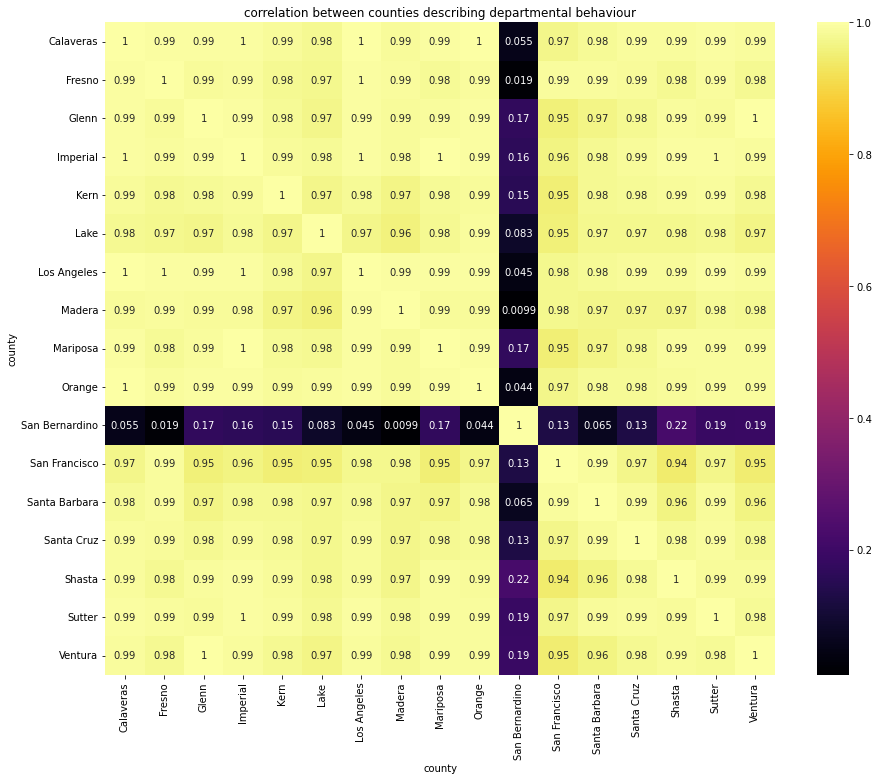

In [75]:
plt.figure(figsize=(15, 12))
sns.heatmap(county_corr, annot=True, cmap="inferno")
plt.title("correlation between counties describing departmental behaviour")
plt.show()

Alle Counties haben wieder sehr starke Korrelationen, nur Counties, die allgemein nicht viele Bestelleungen haben, korrelieren nicht gut mit anderen Counties. San Bernardino gehört auch zu den Counties, die eine niedrige Anzahl der Bestellungen haben.

In [76]:
shopping_df[shopping_df['county'] == 'San Bernardino']['order_id'].count()

366

### 2.4.F5 Top 50 Produkte über Regionen
In diesem Kapitel werden die Top 50 Produkte und deren reigionale Verteilung detailiert analysiert. Das Ziel ist, die Produkte zu groupieren, die eine ähnliche regionale Verteilung haben.
#### 2.4.F5.1 Die top 50 Produkte werden in eine Liste gespeichert

In [77]:
# Top 50 Produkte über den Zeitraum
top_50_prods = shopping_df.groupby('product_name',).agg(
    {
        'order_id': 'count',
    }
).sort_values(by='order_id', ascending=False).head(50).index.to_list()
print(top_50_prods)

['Banana', 'Bag of Organic Bananas', 'Organic Strawberries', 'Organic Baby Spinach', 'Organic Hass Avocado', 'Organic Avocado', 'Large Lemon', 'Strawberries', 'Limes', 'Organic Raspberries', 'Organic Whole Milk', 'Organic Yellow Onion', 'Organic Garlic', 'Organic Zucchini', 'Organic Blueberries', 'Cucumber Kirby', 'Organic Lemon', 'Organic Fuji Apple', 'Seedless Red Grapes', 'Apple Honeycrisp Organic', 'Organic Grape Tomatoes', 'Organic Cucumber', 'Organic Baby Carrots', 'Honeycrisp Apple', 'Organic Half & Half', 'Sparkling Water Grapefruit', 'Organic Large Extra Fancy Fuji Apple', 'Yellow Onions', 'Organic Gala Apples', 'Carrots', 'Organic Baby Arugula', 'Original Hummus', 'Fresh Cauliflower', 'Organic Cilantro', 'Half & Half', 'Organic Red Onion', 'Organic Small Bunch Celery', 'Asparagus', 'Michigan Organic Kale', 'Organic Tomato Cluster', 'Organic Blackberries', '100% Whole Wheat Bread', 'Organic Unsweetened Almond Milk', 'Organic Granny Smith Apple', 'Organic Italian Parsley Bunch'

In [78]:
# regionale Verteilung von top 50 Produkten
top_prods_counties = shopping_df[shopping_df['product_name'].isin(top_50_prods)].groupby(
    ['product_name', 'county'], as_index=False
).agg(
    {
        'order_id': 'count',
    }
)

top_prods_counties

,product_name,county,order_id
0,100% Whole Wheat Bread,Alameda,25
1,100% Whole Wheat Bread,Alpine,226
2,100% Whole Wheat Bread,Amador,178
3,100% Whole Wheat Bread,Calaveras,1159
4,100% Whole Wheat Bread,Colusa,46
...,...,...,...
2742,Yellow Onions,Tulare,27
2743,Yellow Onions,Tuolumne,39
2744,Yellow Onions,Ventura,378
2745,Yellow Onions,Yolo,184


In [79]:
top_50_prods_county_stats = shopping_df[shopping_df['product_name'].isin(top_50_prods)].groupby(
    'product_name'
).apply(agg_on_group, group_level='county')
top_50_prods_county_stats.index = top_50_prods_county_stats.index.droplevel(level=1)
top_50_prods_county_stats.fillna(0, inplace=True)
top_50_prods_county_stats.columns = top_50_prods_county_stats.columns.map(''.join)
top_50_prods_county_stats.head()
# eine Zeile ist ein Produkt und die Spalten die Anzahl der verkauften Produkte in allen Counties

,Alameda,Alpine,Amador,Calaveras,Colusa,Contra Costa,Del Norte,El Dorado,Fresno,Glenn,...,Sonoma,Stanislaus,Sutter,Tehama,Trinity,Tulare,Tuolumne,Ventura,Yolo,Yuba
product_name,,,,,,,,,,,,,,,,,,,,,
100% Whole Wheat Bread,25,226,178,1159,46,185,40,0.0,623,935,...,23,9,254,39.0,0.0,22,45,573,119,276
Apple Honeycrisp Organic,28,400,260,1485,156,212,60,4.0,1028,870,...,16,37,914,7.0,0.0,66,91,775,190,249
Asparagus,23,184,161,1136,61,143,26,21.0,768,717,...,30,48,651,16.0,0.0,56,51,498,257,161
Bag of Organic Bananas,255,1146,1630,5637,538,1027,198,148.0,4804,3889,...,184,237,3090,107.0,4.0,194,305,3065,997,1767
Banana,273,1531,1741,7872,387,1201,165,87.0,5746,4755,...,234,416,4134,156.0,39.0,356,278,3614,1168,2430


#### 2.4.F5.2 Normalisierung der Anzahl in allen Counties

In [80]:
def get_relative_sum(row):
    """
    Gets each row of our top_50_prods_county_stats dataframe.
    Each county gets the relative percentage -> value divided by the sum of total values and then times 100.
    County value divided by row sum and then times 100.
    returns the new row with the percentages.
    """
    row_sum = row.sum()
    row = (row/row_sum) * 100
    return row

In [81]:
# es wird nur die relative Anzahl der verkauften Produkte betrachtet
top_50_prods_county_stats = top_50_prods_county_stats.apply(get_relative_sum, axis=1)

In [82]:
top_50_prods_county_stats.sum(axis=1).unique()

array([100., 100., 100., 100., 100., 100., 100.])

In [83]:
prods_X = top_50_prods_county_stats.values
inertia = []
for num_clusters in range(3, 12):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans = kmeans.fit(prods_X)
    inrt = kmeans.inertia_
    inertia.append(inrt)
    print(f'for {num_clusters} the inertia is: {inrt}')


for 3 the inertia is: 413.5124772594685
for 4 the inertia is: 365.50587045946315
for 5 the inertia is: 343.5564611266067
for 6 the inertia is: 321.3662959704826
for 7 the inertia is: 289.08066381017073
for 8 the inertia is: 274.08458855804236
for 9 the inertia is: 257.57886567513583
for 10 the inertia is: 238.2005975024945
for 11 the inertia is: 221.84680410753975


In [84]:
# sns.lineplot(x=range(3, len(inertia)+3), y=inertia)

#### 2.4.F5.3 Cluster Algorithm um zu gruppieren

In [85]:
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans = kmeans.fit(prods_X)

top_50_prods_county_stats['label'] = kmeans.labels_
top_50_prods_county_stats['group'] = top_50_prods_county_stats['label'].map(
    {
        indx: group_letter
        for indx, group_letter in enumerate(['a', 'b', 'c', 'd'])
})

In [86]:
# top_50_prods_county_stats['fips'] = shopping_df['county'].map(df_fips.to_dict()['fips'])
top_50_prods_county_stats.head()

,Alameda,Alpine,Amador,Calaveras,Colusa,Contra Costa,Del Norte,El Dorado,Fresno,Glenn,...,Sutter,Tehama,Trinity,Tulare,Tuolumne,Ventura,Yolo,Yuba,label,group
product_name,,,,,,,,,,,,,,,,,,,,,
100% Whole Wheat Bread,0.218360,1.973972,1.554721,10.123155,0.401782,1.615862,0.349375,0.000000,5.441523,8.166652,...,2.218534,0.340641,0.000000,0.192157,0.393047,5.004804,1.039392,2.410691,0,a
Apple Honeycrisp Organic,0.175505,2.507208,1.629685,9.308011,0.977811,1.328820,0.376081,0.025072,6.443525,5.453178,...,5.728971,0.043876,0.000000,0.413689,0.570390,4.857716,1.190924,1.560737,3,d
Asparagus,0.179337,1.434698,1.255361,8.857700,0.475634,1.115010,0.202729,0.163743,5.988304,5.590643,...,5.076023,0.124756,0.000000,0.436647,0.397661,3.883041,2.003899,1.255361,0,a
Bag of Organic Bananas,0.361436,1.624334,2.310353,7.989851,0.762558,1.455664,0.280644,0.209774,6.809162,5.512246,...,4.379748,0.151661,0.005670,0.274974,0.432305,4.344313,1.413142,2.504536,3,d
Banana,0.302095,1.694165,1.926546,8.710952,0.428244,1.328996,0.182585,0.096272,6.358375,5.261760,...,4.574578,0.172626,0.043156,0.393940,0.307628,3.999159,1.292479,2.688975,0,a


#### 2.4.F5.4 Einige Gruppenpaare werden zusammen visualisiert

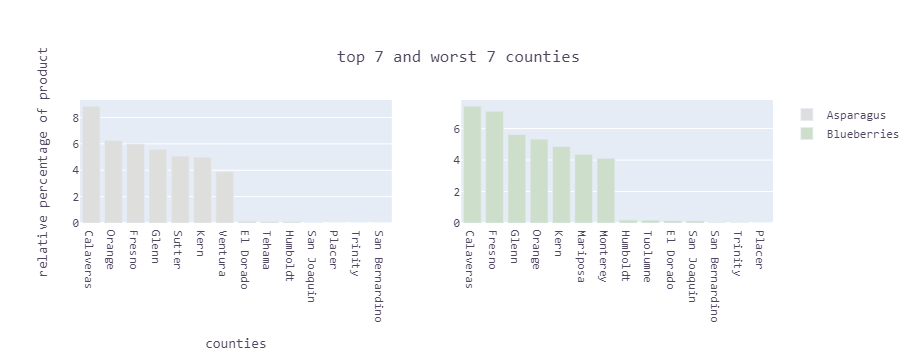

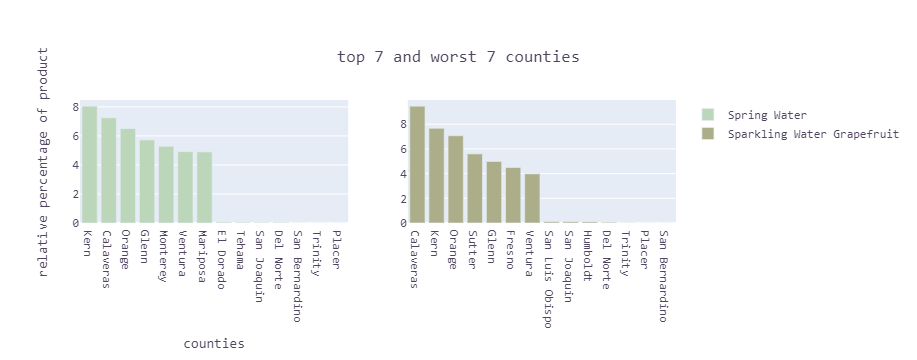

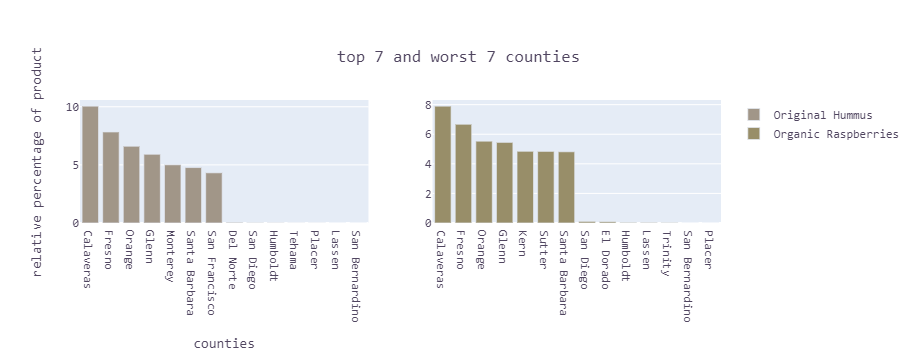

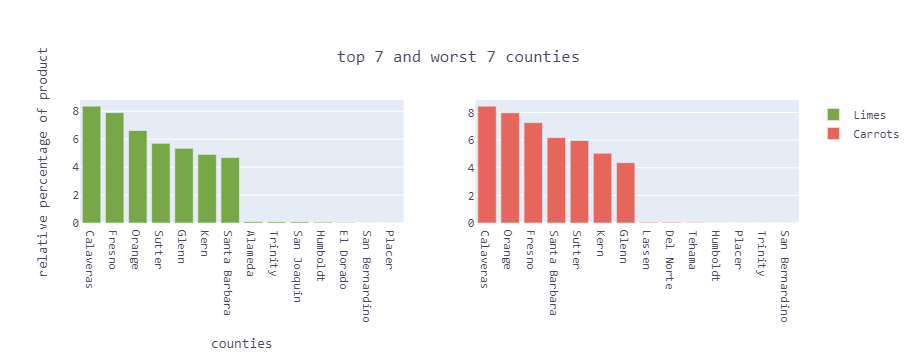

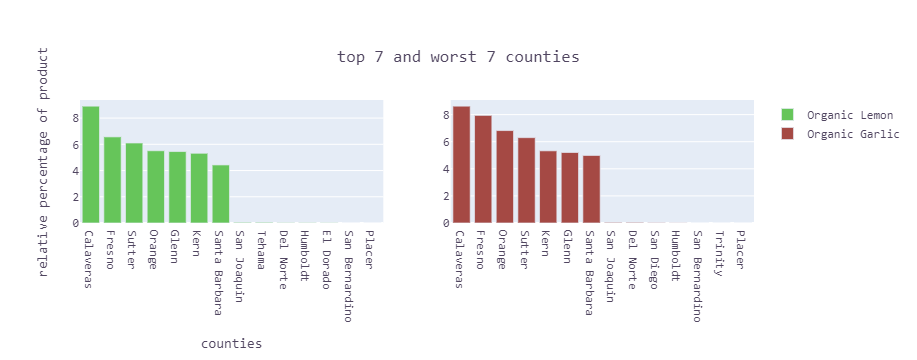

In [87]:
prods = iter([
    'Asparagus', 'Blueberries',
    'Spring Water', 'Sparkling Water Grapefruit',
    'Original Hummus', 'Organic Raspberries',
    'Limes', 'Carrots',
    'Organic Lemon', 'Organic Garlic'
])

colors = iter(['#dededc', '#cddecb', '#bcd6ba', '#abae89', '#a19688', '#988e69', '#78a747',
               '#e6665c', '#66c55a', '#a54944'])
for row in range(1, 6):
    fig = make_subplots(rows=1, cols=2)
    col = 1
    for col in range(1, 3):
        clr = next(colors)
        prod = next(prods)
        temp_df = top_50_prods_county_stats.drop(
    ['label', 'group'], axis=1
    ).loc[prod].sort_values(ascending=False).iloc[list(range(7))+list(range(-7, 0))]
        fig.add_trace(go.Bar(x=temp_df.index, y=temp_df.values, name=f'{prod}', marker_color=clr),
                      row=1, col=col)
        fig.update_layout(
            title={
                "text": "top 7 and worst 7 counties",
                "x": 0.5,
                "xanchor": "center",
                "yanchor": "top"
            },
            font={
                'family': font,
                 'color': font_color
            },
            xaxis_title="counties", yaxis_title="relative percentage of product"
        )
        
        col += 1
        
    fig.show()

#### 2.4.F5.5 Übersicht aller Gruppen

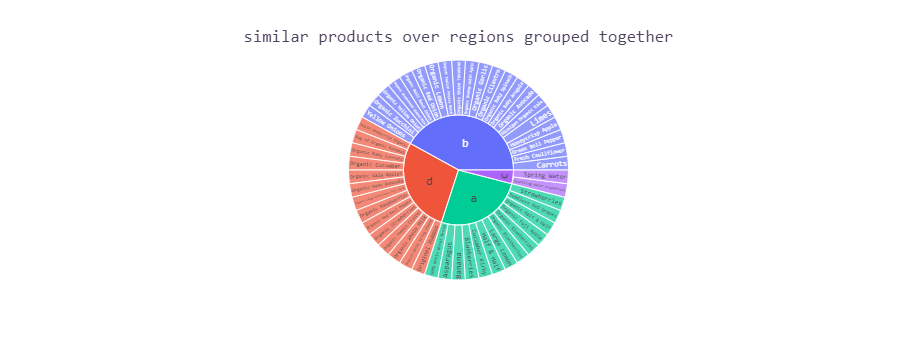

In [88]:
fig = px.sunburst(
    top_50_prods_county_stats.reset_index(),
    path=['group', 'product_name'],
    color_discrete_map={
        'a': '#caddea',
        'b': '#91f9f1',
        'c': '#aaa1b1',
        'd': px.colors.qualitative.Pastel2[2],
    }
)
fig.update_layout(
    title={
        'text':'similar products over regions grouped together',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()

#### 2.4.F5.6 Relation zwischen Produkten

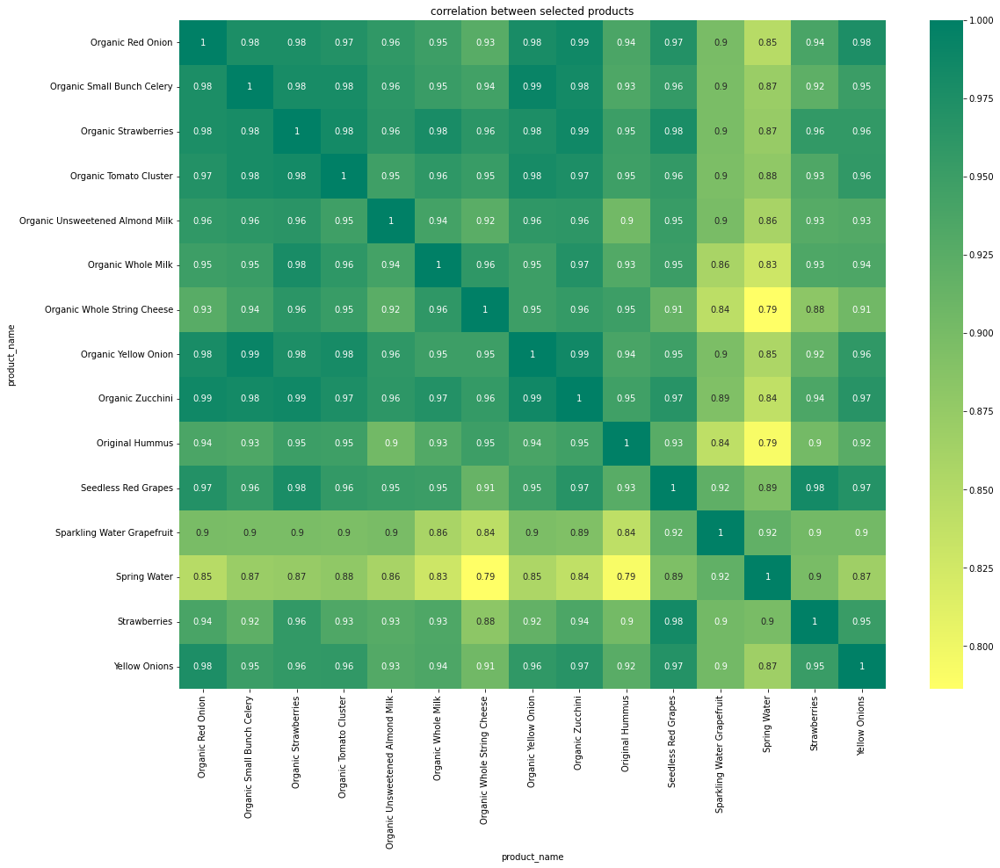

In [89]:
plt.figure(figsize=(18, 14))
sns.heatmap(top_50_prods_county_stats.iloc[35:].drop(['label', 'group'], axis=1).T.corr(), annot=True, cmap="summer_r")
plt.title("correlation between selected products")
plt.show()

----
----

In [90]:
del day_dict
del counties_of_pumkin
del inertia
del three_prods_group
del total_orders_per_county_group
del total_products_sold_per_county
del total_orders_per_county
del popular_values
del popular_values_f3
del x
del products
del frequencies

----
----
## 3. Analyse der Kunden 
----
#### Die besten Kunden über den Zeitraum
----

### 3.1 Kunden mit den meisten Bestellungen (Top 10)

In [91]:
user_orders = shopping_df.groupby('user_id').agg(
    {
        'product_id': 'count',
        'order_id': 'nunique',
    }
).sort_values('order_id', ascending=False).rename(columns={
    'order_id': 'total orders',
    'product_id': 'total products'
})
# über 100 Kunden mit genau 100 Bestellungen
user_orders[['total orders']].head(5)

,total orders
user_id,
61542,100
91035,100
27907,100
40817,100
111466,100


#### 3.1.1 Es gibt 156 Kunden mit genau 100 Bestellungen und kein Kunde hat mehr als 100 Bestellungen

In [92]:
user_orders[['total orders']].value_counts().iloc[35:45]

total orders
41              160
38              158
100             156
39              155
44              147
42              147
40              145
45              139
46              126
47              125
dtype: int64

### 3.2 Kunden mit den besten Bestellungen

In [93]:
user_orders['prods_per_order'] = (user_orders['total products']/user_orders['total orders']).round(0)
user_orders.sort_values('prods_per_order', ascending=False).head(10)

,total products,total orders,prods_per_order
user_id,,,
190889,286,5,57.0
103624,337,6,56.0
142007,1382,26,53.0
138426,202,4,50.0
165145,248,5,50.0
79056,243,5,49.0
101777,196,4,49.0
139055,196,4,49.0
200273,676,14,48.0


Users, die den besten Durchschnitt pro Bestellung haben. User '142007' hat bei 26 Bestelungen einen Durchschnitt von 53 Produkten.

In [94]:
user_orders.sort_values('total products', ascending=False).head(10)

,total products,total orders,prods_per_order
user_id,,,
186704,2936,99,30.0
33731,2912,100,29.0
17738,2596,87,30.0
13701,2579,91,28.0
60694,2579,71,36.0
175294,2307,100,23.0
175540,2283,100,23.0
115495,2277,58,39.0
143402,2277,87,26.0


Users, die die meisten Produkten gekauft haben. User '115495' in nur 58 Bestellungen 2277 Produkte gekauft.

### 3.3 Welche Produkte wurden am meisten von Kunden gekauft, die nur 3 Bestellungen gemacht haben
Bei Users ist die 3 die mindest Anzahl der Bestellunge. Im folgenden wird analysiert, welche Produkte diese Users am meisten gekauft haben.

In [95]:
less_orders_users = user_orders[user_orders['total orders'] == 3].index.to_list()
shopping_df[shopping_df['user_id'].isin(less_orders_users)]['product_name'].value_counts().head(10)

Banana                    648
Bag of Organic Bananas    415
Organic Baby Spinach      319
Organic Strawberries      287
Organic Avocado           256
Large Lemon               208
Strawberries              200
Organic Hass Avocado      197
Limes                     175
Cucumber Kirby            172
Name: product_name, dtype: int64

### 3.4 Welche Produkte haben im Allgemeinen die schlechteste Wiederkaufsrate

In [96]:
prod_reorder_rates = shopping_df.groupby('product_id').agg(
    {
        'product_name':'max',
        'order_id':'count',
        'reordered':'sum',  # Summe von allen 1 dabei wird 0 ignoriert
        'county':'nunique', # Zähle mir alle Countys, indem das jeweilige Produkt angeboten/gekauft wird
        'department_id': 'max',
        'aisle_id': 'max'
    }
).sort_values(by='product_id', ascending=False).reset_index()
prod_reorder_rates.rename(columns={
    'order_id': 'total_orders',
    'reordered': 'total_reorders',
    'county': 'bought_in_counties',
}, inplace=True)
prod_reorder_rates['reorder_percentage'] = (
    (prod_reorder_rates['total_reorders']/prod_reorder_rates['total_orders']) * 100
)
prod_reorder_rates.product_id = prod_reorder_rates.product_id.astype(str)
prod_reorder_rates.head()

,product_id,product_name,total_orders,total_reorders,bought_in_counties,department_id,aisle_id,reorder_percentage
0,49688,Fresh Foaming Cleanser,12,1.0,11,11,73,8.333333
1,49687,Smartblend Healthy Metabolism Dry Cat Food,1,0.0,1,8,41,0.000000
2,49686,Artisan Baguette,33,22.0,9,3,112,66.666667
3,49685,En Croute Roast Hazelnut Cranberry,7,0.0,6,1,42,0.000000
4,49684,"Vodka, Triple Distilled, Twist of Vanilla",1,0.0,1,5,124,0.000000


In [97]:
prod_reorder_rates[prod_reorder_rates['total_orders'] >= 15].sort_values(
    ['reorder_percentage', 'total_orders'], ascending=[True, False]
).head(10)

,product_id,product_name,total_orders,total_reorders,bought_in_counties,department_id,aisle_id,reorder_percentage
24111,23369,Tamarind Paste,57,0.0,30,13,72,0.0
25307,22087,Whole Celery Seed,40,0.0,19,13,104,0.0
39274,6904,Toasted Sesame Seeds,40,0.0,23,13,104,0.0
23198,24364,Organic Chinese Five Spice,35,0.0,21,13,104,0.0
15084,33238,Organic Arrowroot Powder,34,0.0,18,13,104,0.0
34892,11672,Ground Sage,33,0.0,20,13,104,0.0
36074,10376,Organic Caraway Seeds,31,0.0,18,13,104,0.0
45562,57,Flat Toothpicks,31,0.0,18,17,111,0.0
22558,25086,Pure Corn Starch,30,0.0,19,13,17,0.0
10291,38488,Coco Cream of Coconut,29,0.0,18,6,30,0.0


Produkte, die nur einmal verkauft wurden und dann nie wieder (im gegebenen Zeitraum)

In [98]:
prod_reorder_rates[prod_reorder_rates['total_orders'] >= 40].sort_values(
    ['reorder_percentage', 'total_orders'], ascending=[True, False]
).head(10)

,product_id,product_name,total_orders,total_reorders,bought_in_counties,department_id,aisle_id,reorder_percentage
24111,23369,Tamarind Paste,57,0.0,30,13,72,0.000000
25307,22087,Whole Celery Seed,40,0.0,19,13,104,0.000000
39274,6904,Toasted Sesame Seeds,40,0.0,23,13,104,0.000000
13841,34592,Organic Allspice,114,1.0,34,13,104,0.877193
369,49284,Fennel Seed,152,2.0,39,13,104,1.315789
18382,29658,Organic Ground White Pepper,74,1.0,24,13,104,1.351351
17212,30928,Organic Gluten Free Yellow Cornmeal,73,1.0,26,13,17,1.369863
44091,1658,"Double Superfine Mustard Powder, Original English",69,1.0,25,13,104,1.449275
7679,41348,"Shortening, All-Vegetable",64,1.0,29,13,17,1.562500
4661,44626,Ground Allspice,101,2.0,30,13,104,1.980198


Produkte, die fast nie wieder gekauft wurden und auch sehr oft verkauft wurden sind.
In zwei Listen hat man verschiedene Produkte herausgefunden, die sehr schlechte Wiederkaufsraten haben, hier kann man nach Qualität dieser Produkte schauen.

#### 3.4.1 Bei Produkten, die die schlechsten Wiederkaufsraten haben kommt die Abteilung Nr.13 und Gang 104 sehr oft vor.

In [99]:
prod_reorder_rates[prod_reorder_rates['total_orders'] >= 40].sort_values(
    ['reorder_percentage', 'total_orders'], ascending=[True, False]
).head(50)['department_id'].value_counts()

13    42
6      3
17     2
2      1
11     1
15     1
Name: department_id, dtype: int64

In [100]:
prod_reorder_rates[prod_reorder_rates['total_orders'] >= 40].sort_values(
    ['reorder_percentage', 'total_orders'], ascending=[True, False]
).head(50)['aisle_id'].value_counts()

104    29
17      6
66      3
72      2
19      2
97      2
6       1
10      1
29      1
111     1
118     1
59      1
Name: aisle_id, dtype: int64

In [101]:
shopping_df[(shopping_df['department_id'] == 13) & (shopping_df['aisle_id'] == 104)]

,order_id,product_id,add_to_cart_order,reordered,user_id,order_dow,order_hour_of_day,days_since_prior_order,product_name,aisle_id,department_id,department,aisle,county,day,fips
482,51,34099,13,1,137357,2,7,5,Crushed Red Chili Pepper,104,13,pantry,spices seasonings,Orange,Wednesday,06059
533,57,22034,11,0,54878,5,12,8,Rosemary,104,13,pantry,spices seasonings,San Diego,Saturday,06073
748,81,2918,8,0,201770,5,13,20,Chili Seasoning Mix,104,13,pantry,spices seasonings,Imperial,Saturday,06025
864,91,31130,2,0,35250,1,15,12,Sea Salt Flakes Original,104,13,pantry,spices seasonings,Calaveras,Tuesday,06009
1090,110,16325,6,0,3351,3,0,30,Turmeric,104,13,pantry,spices seasonings,Ventura,Thursday,06111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6145177,604882,35333,11,0,84474,1,7,5,Seasoning Bay Leaf,104,13,pantry,spices seasonings,Merced,Tuesday,06047
6145379,604898,11577,19,0,80562,1,10,30,Pure Ground Black Pepper,104,13,pantry,spices seasonings,Orange,Tuesday,06059
6145405,604899,29740,19,0,129884,6,19,13,Organic Chili Powder Blend,104,13,pantry,spices seasonings,Ventura,Sunday,06111
6145596,604920,38903,11,0,93942,0,10,1,Spanish Saffron,104,13,pantry,spices seasonings,San Benito,Monday,06069


### 3.5 Kundenverhalten an verschiedenen Wochentagen und Uhrzeiten

#### 3.5.1 Anzahl der Bestellungen an Wochentagen

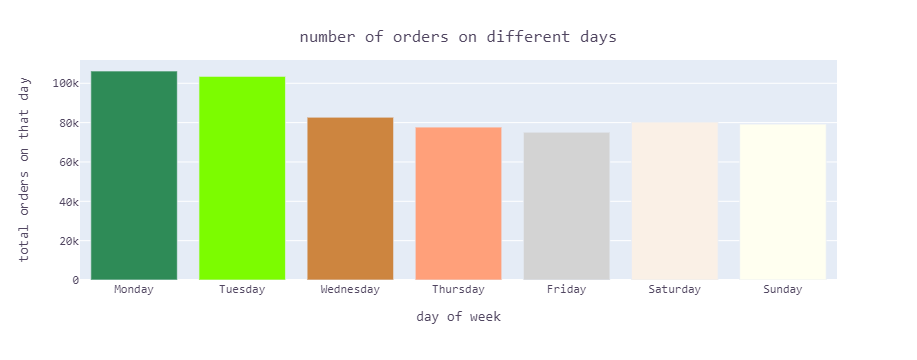

In [102]:
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
colors = ['seagreen', 'lawngreen', 'peru', ' lightsalmon', 'lightgrey', 'linen', 'ivory']
fig = px.bar(
    shopping_df.groupby('day').agg({'order_id': 'nunique'}).reset_index(),
    x='day', y='order_id', color='day',
    category_orders={'day': days},
    color_discrete_map={
        day:color
        for day, color in zip(days, colors)
    },
    labels={'order_id': 'total orders on that day', 'day': 'day of week'}
)
fig.update_layout(
    showlegend = False,
    title={
        'text':'number of orders on different days',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
)

#### 3.5.2 Anzahl der Bestellungen an verschiedenen Uhrzeiten an allen Wochentagen

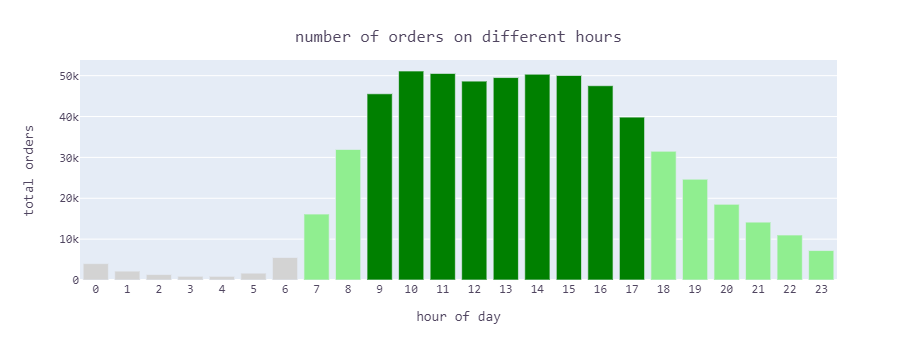

In [103]:
# Farben für den Bericht
day_df = shopping_df.groupby('order_hour_of_day').agg(
            {'order_id': 'nunique'}
        ).reset_index()
tops = list(range(9, 17))
fig= px.bar(
    day_df, color=day_df['order_hour_of_day'].astype('str'),
    x=day_df['order_hour_of_day'].astype('str')
    , y='order_id',
    color_discrete_sequence=['lightgrey']*7+['lightgreen']*2+['green']*9+['lightgreen']*6,
    labels={
        'x': 'hour of day',
        'order_id': 'total orders'
    }
    
)
fig.update_layout(
    showlegend = False,
    title={
        'text': 'number of orders on different hours',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()

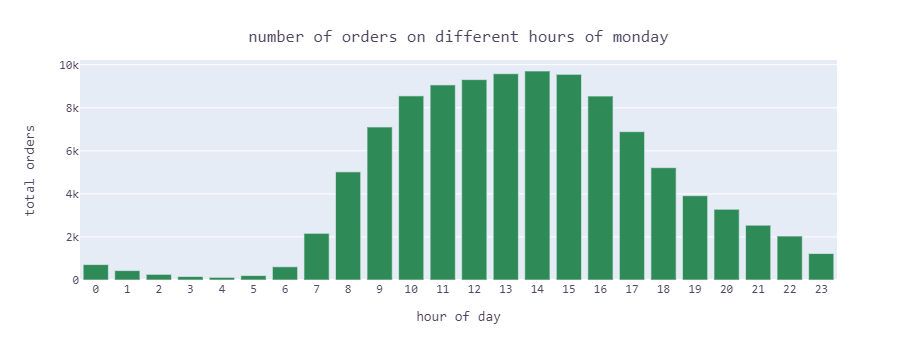

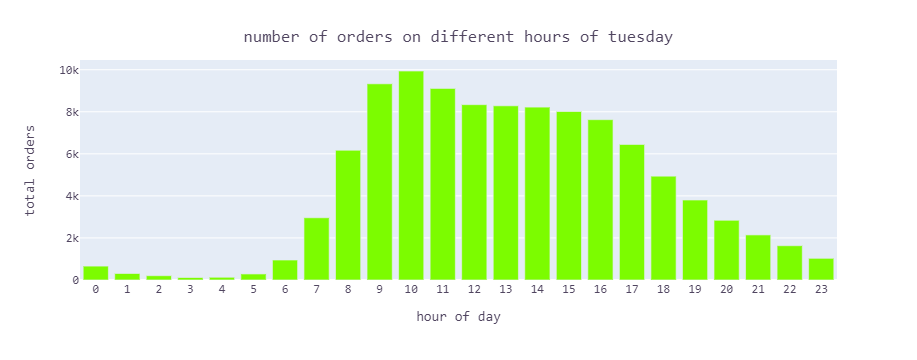

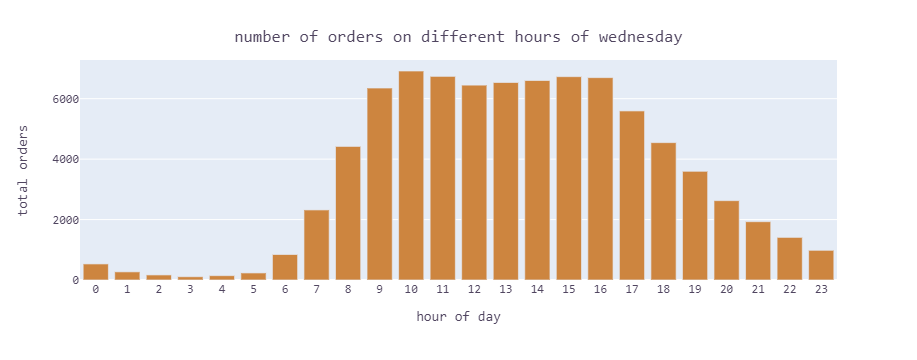

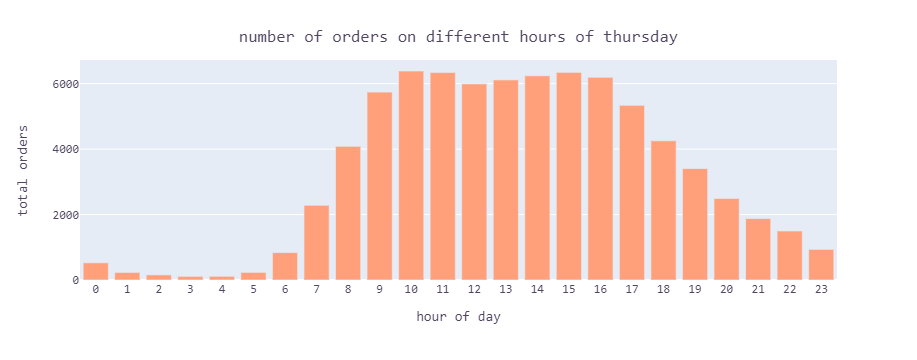

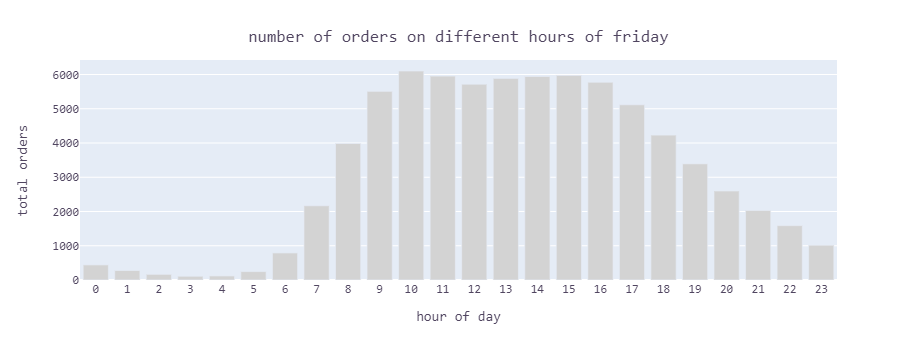

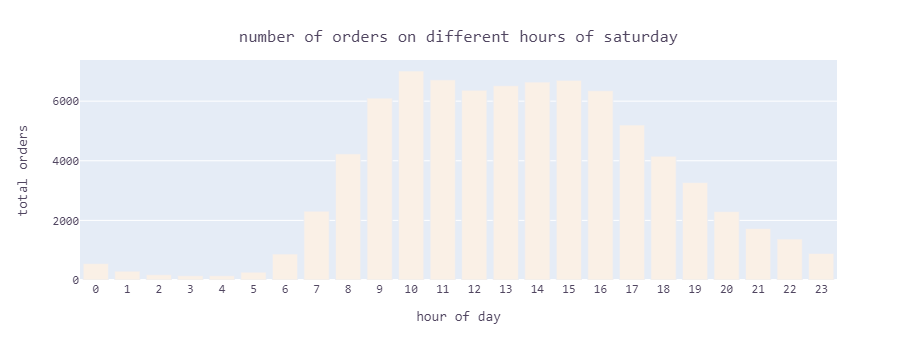

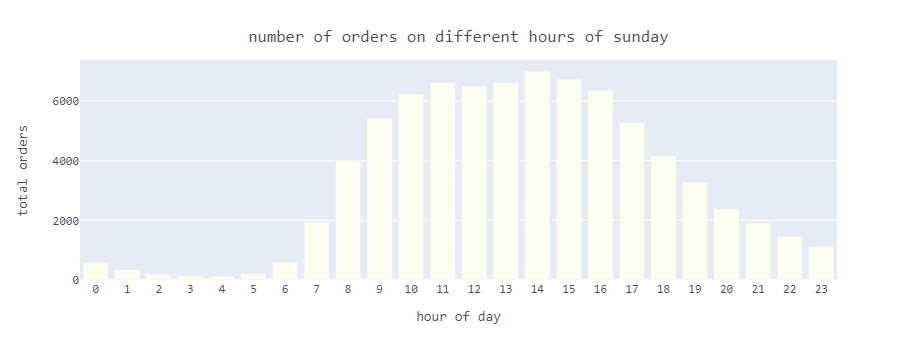

In [104]:
for idx, day in enumerate(days):
    day_df = shopping_df[shopping_df['day'] == day].groupby('order_hour_of_day').agg(
            {'order_id': 'nunique'}
        ).reset_index()
    fig = px.bar(
        day_df,
        x=day_df['order_hour_of_day'].astype(str), y='order_id',
        color=day_df['order_hour_of_day'].astype(str), color_discrete_map={
            str(num):colors[idx]
            for num in range(24)
        },
        labels={
            'x': 'hour of day',
            'order_id': 'total orders'
        }
    )
    fig.update_layout(
    showlegend = False,
    title={
        'text': f'number of orders on different hours of {day.lower()}',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
    )
    fig.show()
    

----
----

In [105]:
del all_orders_normal_bars
del top_50_prods
del top_50_prods_county_stats
del top_deps_per_county

----
----

----
# 4. Warenkorbanalyse
----

### 4.1 Ein Wordcloud von den bestverkauften Produkten
Ein wordcloud um zu zeigen, wie beliebt die organischen und natürlichen Produkte sind

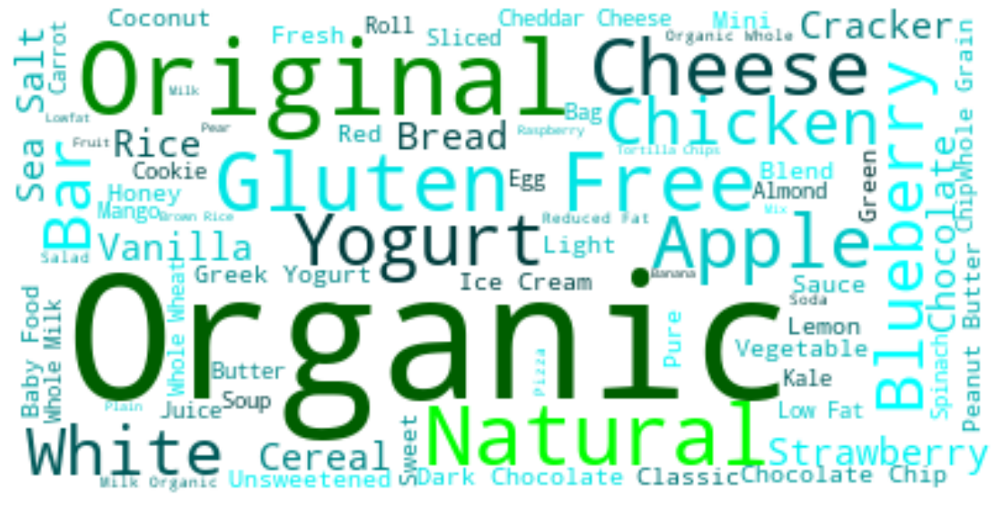

In [106]:
from wordcloud import WordCloud
# Die Datei ist nötig um die Farben zu ändern
# Code von der Dokumentaion
from word_cloud_am_exm import GroupedColorFunc

words = shopping_df.groupby('product_name',as_index = False).agg(
    {
        'product_id':'count'
    }
).sort_values('product_id',ascending=False).head(5000)['product_name'].unique()
text = ""
for element in words:
    text += element + ' '
    
color_to_words = {
    # words below will be colored with a green single color function
    '#00ff00': ['Organic', 'Original', 'Natural'],
}

default_color = '#00FFFF'

wordcloud = WordCloud(max_font_size=70, max_words=75, background_color="white").generate(text)
grouped_color_func = GroupedColorFunc(color_to_words, default_color)
wordcloud.recolor(color_func=grouped_color_func)
plt.figure(figsize = (20,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
# wordcloud.to_file("wordCloud.png")
plt.show()

### 4.2 Anteil der Produkte über alle Bestellungen

In [107]:
# DataFrame mit den relativen und kommulierten Häufigkeiten
df = shopping_df.groupby('product_id',as_index=False).agg(
    {
        'product_id':'count', 'product_name':'max'
    }
).rename(columns={'product_id':'sum_of_product'})
df = df.sort_values('sum_of_product',ascending = False)
df['fi'] = df['sum_of_product'] / 6145748
df['Fi'] = 0
df.iloc[0,3] = df.iloc[0,2]
for i in range(45615):
    df.iloc[i+1, 3] = df.iloc[i, 3] + df.iloc[i+1, 2]

#### 4.2.1 Bei der nächsten Visualisierung untersuchen wir die Verteilung der Produkte bei 90% der Einträge

##### 4.2.1.1 19% der Produkte haben einen Anteil von 90% an allen Bestellungen

In [108]:
prc = 0.9
best_selling_products = shopping_df.groupby('product_name',as_index = False).agg(
    {'product_id':'count'}
).sort_values('product_id',ascending=False).head(len(df[df['Fi'] < prc]))['product_name'].unique()

a = prc
b = len(best_selling_products)
c = df[df['Fi'] < prc]['sum_of_product'].sum()
d = df[df['Fi'] < prc]['sum_of_product'].min()
print(f'{100*a}% der Verkäufe ({c}) sind mit {b} Produkten ({round((b/45616)*100, 1)} %) verkauft worden, bei einem Schwellenwert von {d} Verkäufe pro Produkt')


90.0% der Verkäufe (5531092) sind mit 8986 Produkten (19.7 %) verkauft worden, bei einem Schwellenwert von 84 Verkäufe pro Produkt


##### 4.2.1.2 1,7% der Produkte haben einen Anteil von 50% an allen Bestellungen

In [109]:
prc = 0.5
best_selling_products = shopping_df.groupby('product_name',as_index = False).agg(
    {'product_id':'count'}
).sort_values('product_id',ascending=False).head(len(df[df['Fi'] < prc]))['product_name'].unique()

a = prc
b = len(best_selling_products)
c = df[df['Fi'] < prc]['sum_of_product'].sum()
d = df[df['Fi'] < prc]['sum_of_product'].min()
print(f'{100*a}% der Verkäufe ({c}) sind mit {b} Produkten ({round((b/45616)*100, 1)} %) verkauft worden, bei einem Schwellenwert von {d} Verkäufe pro Produkt')


50.0% der Verkäufe (3072400) sind mit 783 Produkten (1.7 %) verkauft worden, bei einem Schwellenwert von 1295 Verkäufe pro Produkt


In [110]:
prc = 0.9
best_selling_products = shopping_df.groupby('product_name',as_index = False).agg(
    {'product_id':'count'}
).sort_values('product_id',ascending=False).head(len(df[df['Fi'] < prc]))['product_name'].unique()

a = prc
b = len(best_selling_products)
c = df[df['Fi'] < prc]['sum_of_product'].sum()
d = df[df['Fi'] < prc]['sum_of_product'].min()

# create df with 21 rows and 7 columns, thus departments and calculations for the next Diagramms
new_df = pd.DataFrame({'department':shopping_df['department'].unique()})
new_df = new_df.merge(shopping_df.groupby('department').agg(
    {'department_id':'count'}
)[['department_id']], how = 'left', on = 'department').rename(
    columns={'department_id':'sum_entries'}
)

new_df = new_df.merge(shopping_df[shopping_df['product_name'].isin(best_selling_products)].groupby('department').agg(
    {'department_id':'count'}), how = 'left', on = 'department').rename(
    columns={'department_id':'sum_entries_of_best_selling_products'}
).fillna(0)
new_df['sum_entries_rest_products'] = new_df.sum_entries - new_df.sum_entries_of_best_selling_products

new_df = new_df.merge(shopping_df.groupby('department').agg(
    {'product_id':'nunique'}
), how = 'left', on = 'department').rename(columns={'product_id':'sum_products'})

new_df = new_df.merge(shopping_df[shopping_df['product_name'].isin(best_selling_products)].groupby('department').agg(
    {'product_id':'nunique'}
), how = 'left', on = 'department').rename(
    columns={'product_id':'sum_best_selling_products'}
).fillna(0)

new_df['sum_rest_products'] = new_df.sum_products - new_df.sum_best_selling_products

# add ALL PRODUCTS row
new_df.index += 1
dfnew_row = pd.DataFrame([['ALL PRODUCTS',new_df['sum_entries'].sum(),
                           new_df['sum_entries_of_best_selling_products'].sum(),
                           new_df['sum_entries_rest_products'].sum(),new_df['sum_products'].sum(),
                           new_df['sum_best_selling_products'].sum(),new_df['sum_rest_products'].sum()]],
                         columns=new_df.columns)

new_df = pd.concat([dfnew_row, new_df])

Prozentuale Darstellung der Anteil der best selling Produkte an den Verkäufen pro Department.

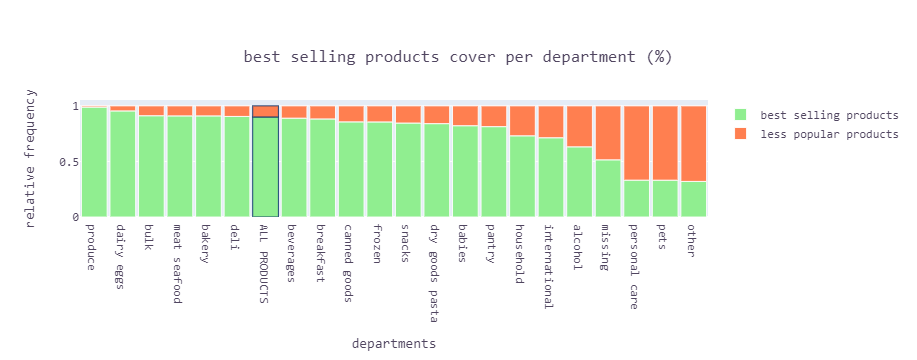

In [111]:
fig = go.Figure()

new_df['d1a'] = new_df['sum_entries_of_best_selling_products']/new_df['sum_entries']
new_df = new_df.sort_values('d1a',ascending = False)
all_prod_idx = new_df.department.tolist().index("ALL PRODUCTS")

lines = ['white'] * 22
lines[all_prod_idx] = 'rgb(8,48,107)'

x = new_df['department']
fig.add_bar(x=x,y=new_df['d1a'], name = 'best selling products', marker_color='LightGreen')

fig.add_bar(x=x,y=new_df['sum_entries_rest_products']/new_df['sum_entries'],
            name = 'less popular products', marker_color='coral')

fig.update_traces(marker_line_color=lines,
                  marker_line_width=0.8)
fig.update_layout(
    bargap = 0.1,
    xaxis_title="departments", yaxis_title="relative frequency",
    barmode="relative",
    title={
        'text': 'best selling products cover per department (%)',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()

#### In den meisten Abteilungen machen die best selling Produkte fast die gesamte Verkäufe zusammen. In der Deparemtents personal care und Pets machen die best selling Produkte weniger als ein Drittel der Verkäufe aus.

#### 4.2.2 Absolute Darstellung der Verteilung der Produkten pro Department. 
Anzahl der Produkte von allen Abteilungen, verglichen mit den Produkten, die am meisten verkauft wurden.

#### Hier sieht man wieder, dass die meisten Produkte von allen Abteilungen nicht so oft verkauft wurden.

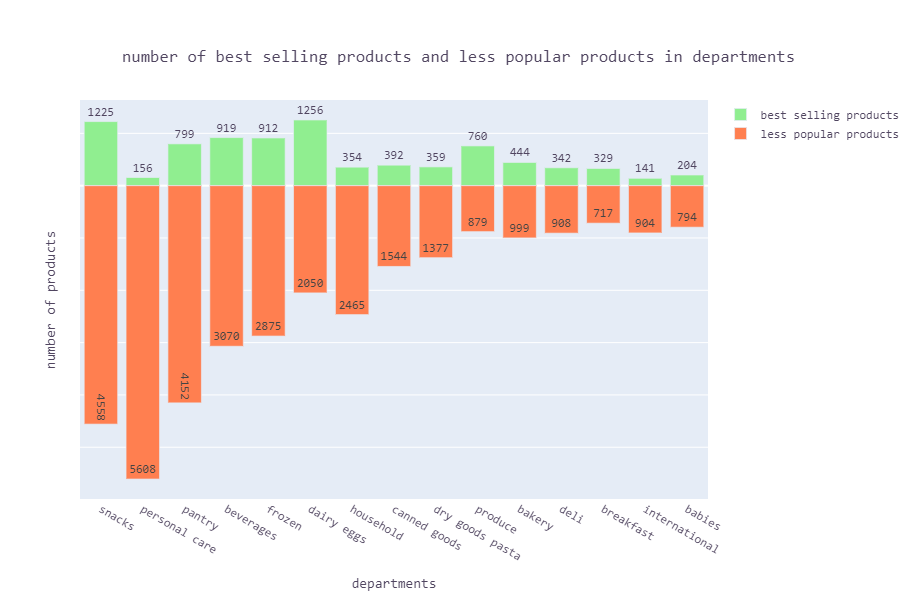

In [112]:
all_prod_idx = new_df.department.tolist().index("ALL PRODUCTS")
new_df1 = new_df.drop([0]).sort_values('sum_products',ascending=False).head(15)

fig = go.Figure()

x = new_df1['department']
fig.add_bar(x=x,y=new_df1['sum_best_selling_products'], name='best selling products',
            text=new_df1['sum_best_selling_products'], hovertemplate="(%{x}, %{y})",
            marker_color = 'LightGreen')

fig.update_traces( textposition='outside')
fig.add_bar(x=x,y=-new_df1['sum_rest_products'],  name='less popular products',
            text = new_df1['sum_rest_products'], meta=new_df1['sum_rest_products'].abs(),
            hovertemplate="(%{x}, %{meta})", marker_color = 'coral')
fig.update_yaxes(showticklabels=False)

fig.update_layout(
    autosize=False,
    xaxis_title="departments", yaxis_title="number of products", 
    width=1000,
    height=600, barmode="relative",
    title={
        'text': 'number of best selling products and less popular products in departments',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()

### 4.3.F6 Weitere Warenkorbanalysen und Zusammenhänge

#### 4.3.F6.1 Prozentuale Darstellung von der Verteilung von Departments zu jedem add_to_cart_order

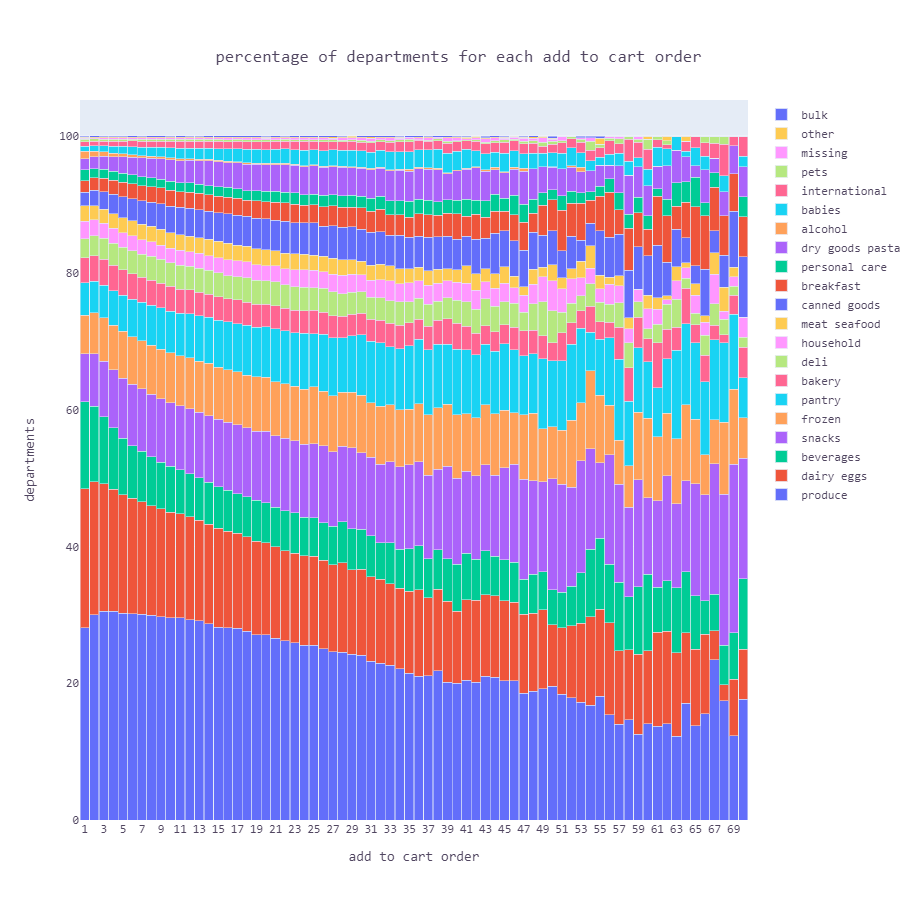

In [113]:
dfw = shopping_df.groupby(['department_id']).agg({'department':'max'})
    
for i in range(70):
  
    dfw[f'{str(i+1)}'] = 0
    df3=shopping_df.loc[shopping_df.add_to_cart_order == i+1].groupby(['department_id'],as_index = False).agg({
            'product_id':'count',
})
    
    for j in range (21):
        dfw.iloc[j,i+1] = (100*df3.loc[df3.department_id == j+1]['product_id'].sum()/df3['product_id'].sum()).round(2)
        
dfw = dfw.set_index(['department']).sort_values('1',ascending=False) 

dfw = dfw.T

x = dfw.index.values
fig = go.Figure()

for dep in dfw.columns:
    fig.add_bar(x=x,y=dfw[dep], name = dep)

fig.update_layout(
    barmode="stack",bargap=0.02, width=1100, height=900,
    xaxis_title="add to cart order", yaxis_title="departments",
    title={
        'text': 'percentage of departments for each add to cart order',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()

#### Das zeigt wieder, dass die Abteilungen 'produce' und 'dairy eggs' am meisten am Anfang der Bestellung gewählt werden. Das war schon zu erwarten, da sie allgemein die besten Abteilungen sind. Interessant sind aber die Verteilungen von Abteilungen 'snacks', 'frozen' und 'pantry'. Die 3 Abteilungen haben eine hohe Wahrscheinlichkeit am Ende der Bestellung gewählt zu werden als am Anfang. 

----
#### 4.3.F6.2 Nullhypothese: Es gibt keinen Untershchied in der zeitlichen Verteilung zwischen den Verkäufen von Produkten aus der Kategorie “beverages” und jenen aus der Kategorie “alcohol”.

In [114]:
el1 = 'beverages'
el2 = 'alcohol'

df1 = shopping_df[shopping_df['department'] == el1].groupby('day').agg(
    {
        'department_id':'count'
    }
).rename(columns={'department_id':el1}).merge(
    shopping_df[shopping_df['department'] == el2].groupby('day').agg(
        {'department_id':'count'}
    ).rename(columns={'department_id':el2}), how = 'left', on = 'day'
)
df1 = df1.reindex(days)

##### Die Anzahl der verkauften Produkte in der Abteilung 'alcohol' wird mit der Abteilung 'beverages' verglichen

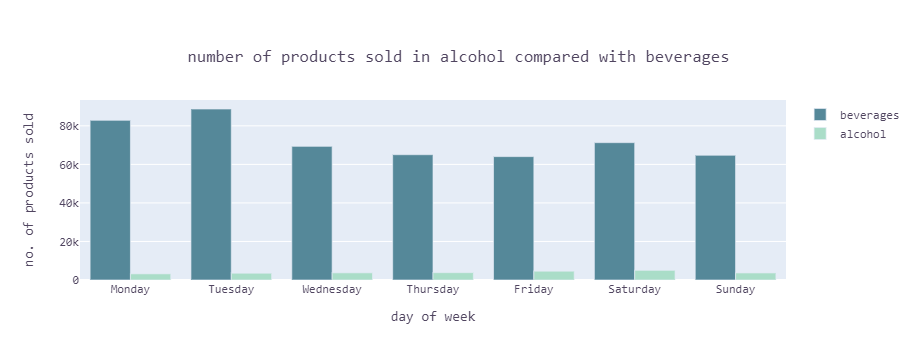

In [115]:
col_bev = '#558899'
col_alc = '#aaddc8'
fig = go.Figure()
x= df1.index.values
fig.add_bar(x = x, y=df1[el1], marker_color=col_bev,name = el1)
fig.add_bar(x = x, y=df1[el2],marker_color = col_alc, name = el2)
fig.update_layout(
    xaxis_title="day of week", yaxis_title="no. of products sold",
    title={
        'text': 'number of products sold in alcohol compared with beverages',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()

In [116]:
#pd.Categorical(df1.index, categories=days, ordered=True)
print(df1.reindex(days))
df1

           beverages  alcohol
day                          
Monday         82884     3194
Tuesday        88733     3534
Wednesday      69373     3726
Thursday       65018     3815
Friday         64035     4583
Saturday       71276     5028
Sunday         64738     3671


,beverages,alcohol
day,,
Monday,82884,3194
Tuesday,88733,3534
Wednesday,69373,3726
Thursday,65018,3815
Friday,64035,4583
Saturday,71276,5028
Sunday,64738,3671


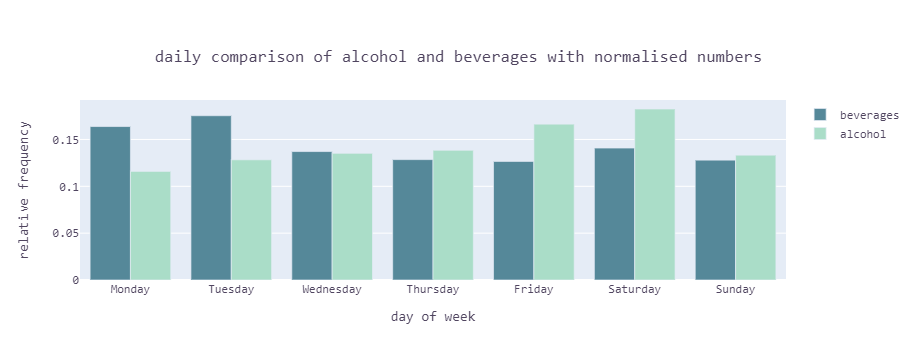

In [117]:
df_n = df1.copy()
df_n[el1] = df1[el1]/df1[el1].sum()
df_n[el2] = df1[el2]/df1[el2].sum()

data = df_n[[el1,el2]]

fig = go.Figure()
fig.add_bar(x=days, y=data[el1], marker_color=col_bev,name = el1)
fig.add_bar(x=days, y=data[el2],marker_color=col_alc,name = el2)
fig.update_layout(
    xaxis_title="day of week",
    yaxis_title="relative frequency",
    title={
        'text': 'daily comparison of alcohol and beverages with normalised numbers',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
)

In [118]:
from scipy.stats import chi2_contingency
ch2, p, dof, expected = chi2_contingency(df1)
print(expected)
print('P-Wert: ', p)

[[81633.66075096  4444.33924904]
 [87503.11318234  4763.88681766]
 [69324.78644061  3774.21355939]
 [65279.04656789  3553.95343211]
 [65075.14734787  3542.85265213]
 [72364.3073717   3939.6926283 ]
 [64876.93833863  3532.06166137]]
P-Wert:  3.8613546320768144e-293


##### Es wurde mittels eines Chi-Quadrat Tests überprüft, ob es einen Unterschied in der zeitlichen Verteilung der Verkaufszahlen von Produkten aus der Kategorie “beverages” und jener aus der Kategorie “alcohol” gibt. Zeitlicher Verlauf meint dabei, wie viele Produkte an welchem Wochentag verkauft wurden.
##### P = 3.8613546320768144e-293
##### Nullhypothese wird verworfen falls p<alpha = 0.1%
##### Wir haben herausgefunden, dass es einen hochsignifikanten Unterschied im zeitlichen Verlauf gibt. Alpha < 0.1
##### Alternativehypothese: Es gibt einen Unterschied in der zeitlichen Verteilung von Produkten aus der Kategorie 'beverages' und jener aus der Kategorie 'alcohol

----
#### 4.3.F6.3 Die verkauften Produkte, die als Organic gekennzeichnet sind

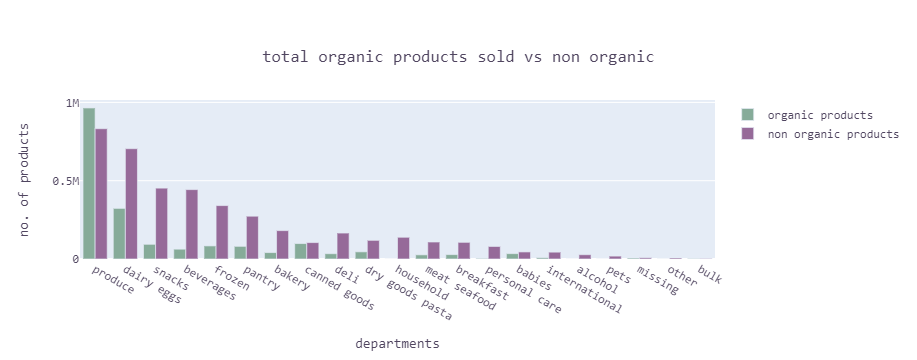

percentage of products bought with organic in it from all products bought 0.3156920849992548
percentage of organic products from all products 0.10456857243072606


In [119]:
shopping_df['organic_Food'] = shopping_df['product_name'].str.contains('Organic')
dfOrg = shopping_df[shopping_df['organic_Food'] == True].groupby('department').agg(
    {'department_id':'count'}
).rename(
    columns={'department_id':'organic'}
).merge(shopping_df.groupby('department').agg(
    {'department_id': 'count'}
).rename(columns={'department_id': 'total'}) ,how='left', on='department')

dfOrg = dfOrg.sort_values('total', ascending=False)

col_org = '#86ab99'
col_nonorg = '#966a99'
fig = go.Figure()
fig.add_bar(
    x = dfOrg.index.values, y=dfOrg['organic'], marker_color=col_org, 
    name='organic products'
)
fig.add_bar(
    x=dfOrg.index.values, y=dfOrg['total']-dfOrg['organic'],marker_color=col_nonorg,
    name='non organic products'
)


fig.update_layout(
    barmode="group",
    xaxis_title="departments", yaxis_title='no. of products',
    title={
        'text': 'total organic products sold vs non organic',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()
print(
    'percentage of products bought with organic in it from all products bought',
    len(shopping_df[shopping_df['organic_Food'] == True]) / len(shopping_df)
)
print(
    'percentage of organic products from all products',
    sum('Organic' in s for s in shopping_df['product_name'].unique())/45616
)

#### 31.57% der Verkäufe sind Organic. 10.45% der Produkte sind Organic
----

#### 4.3.F6.4 Produktpaare: Beste Produkte Paare, Beste Gänge Paare, Beste Kategorien Paare
#### 4.3.F6.4.1 Die besten 'aisle Kombinationen', die zusammen gekauft werden

In [120]:
# from itertools import combinations
# from collections import Counter
# list1 = []
# df2 = shopping_df[shopping_df['order_id'].duplicated(keep=False)]

# df2['grouped'] = df2.groupby('order_id')['aisle'].transform(lambda x: ','.join(x))
# df3 = df2[['order_id', 'grouped']].drop_duplicates()

# count = Counter()

# for row in df3['grouped']:
#     row_list = row.split(',')
#     row_list.sort()
#     count.update(Counter(combinations(row_list, 2)))

# for key,value in count.most_common(25):
#     print(key, ',', value)
#     list1.append((key, value))

Code um die besten Paare zu bekommen, die am meisten zusammen gekauft werden.
Die Code-Zeilen wurden auskommentiert, weil es sehr lange braucht um auszuführen. Das Ergbnis wurde in eine Liste gespeichert und ist auch in einer Markdown-Zelle zu sehen. 

('fresh fruits', 'fresh vegetables') , 1264587
('fresh vegetables', 'fresh vegetables') , 884586
('fresh vegetables', 'packaged vegetables fruits') , 665682
('fresh fruits', 'packaged vegetables fruits') , 649917
('fresh fruits', 'fresh fruits') , 648307
('fresh fruits', 'yogurt') , 490691
('fresh vegetables', 'yogurt') , 385766
('fresh fruits', 'packaged cheese') , 304441
('fresh vegetables', 'packaged cheese') , 298867
('fresh fruits', 'milk') , 266575
('yogurt', 'yogurt') , 256292
('packaged vegetables fruits', 'yogurt') , 223481
('fresh vegetables', 'milk') , 217603
('fresh herbs', 'fresh vegetables') , 215250
('fresh fruits', 'water seltzer sparkling water') , 197888
('chips pretzels', 'fresh fruits') , 196400
('fresh fruits', 'soy lactosefree') , 196388
('fresh vegetables', 'soy lactosefree') , 186451
('fresh vegetables', 'frozen produce') , 180869
('fresh fruits', 'frozen produce') , 177015
('bread', 'fresh fruits') , 176613
('fresh vegetables', 'water seltzer sparkling water') , 165551
('chips pretzels', 'fresh vegetables') , 164252
('packaged vegetables fruits', 'packaged vegetables fruits') , 163054
('packaged cheese', 'packaged vegetables fruits') , 160662

In [121]:
pairs_list = [
    (('fresh fruits', 'fresh vegetables') , 1264587),
(('fresh vegetables', 'fresh vegetables') , 884586),
(('fresh vegetables', 'packaged vegetables fruits') , 665682),
(('fresh fruits', 'packaged vegetables fruits') , 649917),
(('fresh fruits', 'fresh fruits') , 648307),
(('fresh fruits', 'yogurt') , 490691),
(('fresh vegetables', 'yogurt') , 385766),
(('fresh fruits', 'packaged cheese') , 304441),
(('fresh vegetables', 'packaged cheese') , 298867),
(('fresh fruits', 'milk') , 266575)
]
df1 = pd.DataFrame({
    'aisle pair':[
        pair[0]
        for pair in pairs_list
    ],
    'times bought together':[
        pair[1]
        for pair in pairs_list
    ]
})

df1['aisle pair'] = df1['aisle pair'].map(' : '.join)
df1 = df1.sort_values('times bought together', ascending=False)

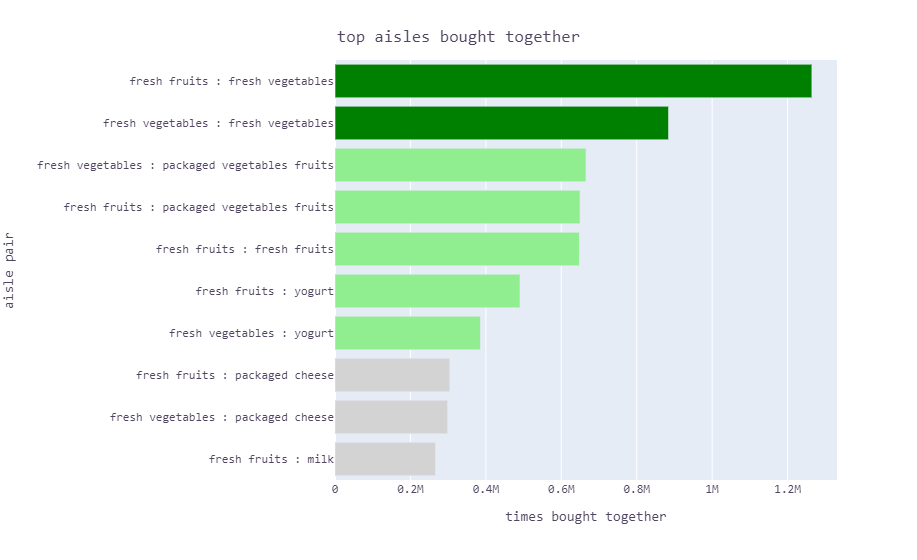

In [122]:
fig = px.bar(
    df1, y='aisle pair', x='times bought together',
    color='aisle pair',
    color_discrete_sequence=['green']*2+['lightgreen']*5+['lightgrey']*3
)
fig.update_layout(
    showlegend=False,
    width=1000, height=560,
    title={
        'text': 'top aisles bought together',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
)
fig.show()

##### Die Produkte von fresh fruits und fresh vegetables werden sehr oft zusammen gekauft

#### 4.3.F6.4.2 Die besten 'Produkt-Kombinationen', die zusammen gekauft werden

In [123]:
# pairs_list = []
# df2 = shopping_df[shopping_df['order_id'].duplicated(keep=False)]

# df2['grouped'] = df2.groupby('order_id')['product_name'].transform(lambda x: ','.join(x))
# df3 = df2[['order_id', 'grouped']].drop_duplicates()

# count = Counter()

# for row in df3['grouped']:
#     row_list = row.split(',')
#     row_list.sort()
#     count.update(Counter(combinations(row_list, 2)))

# for key,value in count.most_common(25):
#     print('(', key, ',', value, ')')
#     pairs_list.append((key, value))

Code um die besten Paare zu bekommen, die am meisten zusammen gekauft werden.
Die Code-Zeilen wurden auskommentiert, weil es sehr lange braucht um auszuführen. Das Ergbnis wurde in eine Liste gespeichert und ist auch in einer Markdown-Zelle zu sehen. 

( ('Bag of Organic Bananas', 'Organic Hass Avocado') , 11680 )
( ('Bag of Organic Bananas', 'Organic Strawberries') , 11516 )
( ('Banana', 'Organic Strawberries') , 11373 )
( ('Banana', 'Organic Avocado') , 10421 )
( ('Banana', 'Organic Baby Spinach') , 10183 )
( ('Bag of Organic Bananas', 'Organic Baby Spinach') , 9598 )
( ('Banana', 'Strawberries') , 8121 )
( ('Organic Hass Avocado', 'Organic Strawberries') , 7871 )
( (' Bag', 'Clementines') , 7757 )
( ('Banana', 'Large Lemon') , 7628 )

In [124]:
pairs_list = [
    ( ('Bag of Organic Bananas', 'Organic Hass Avocado') , 11680 ),
( ('Bag of Organic Bananas', 'Organic Strawberries') , 11516 ),
( ('Banana', 'Organic Strawberries') , 11373 ),
( ('Banana', 'Organic Avocado') , 10421 ),
( ('Banana', 'Organic Baby Spinach') , 10183 ),
( ('Bag of Organic Bananas', 'Organic Baby Spinach') , 9598 ),
( ('Banana', 'Strawberries') , 8121 ),
( ('Organic Hass Avocado', 'Organic Strawberries') , 7871 ),
( (' Bag', 'Clementines') , 7757 ),
( ('Banana', 'Large Lemon') , 7628 )
] 
df1 = pd.DataFrame(
    {
        'product pair':[
            pair[0]
            for pair in pairs_list
        ],
        'times bought together':[
            pair[1]
            for pair in pairs_list
        ]
    }
)

df1['product pair'] = df1['product pair'].map(' : '.join)
df1 = df1.sort_values('times bought together', ascending=False)

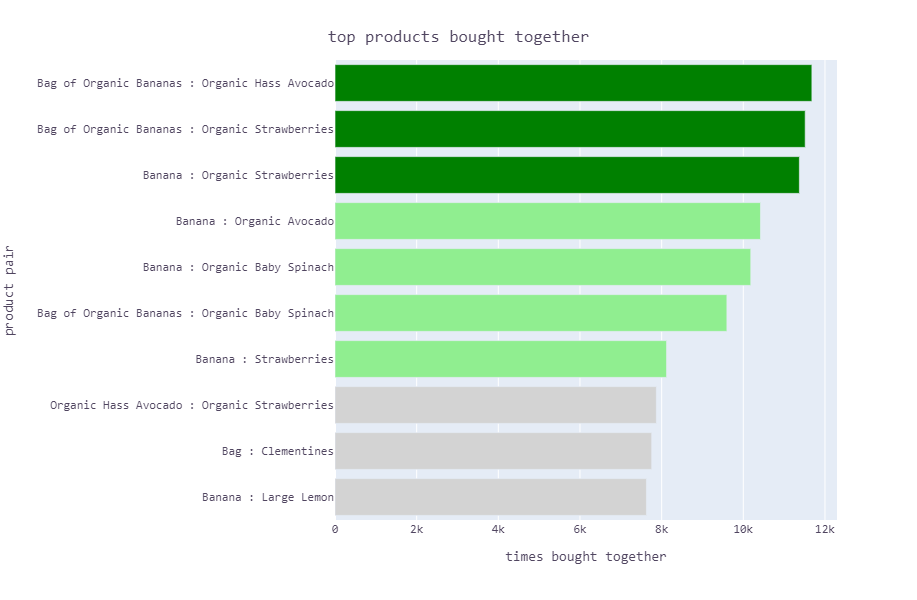

In [125]:
fig = px.bar(
    df1, y='product pair', x='times bought together',
    color='product pair',
             color_discrete_sequence=['green']*3+['lightgreen']*4+['lightgrey']*3
)
fig.update_layout(
    width=1000, height=600,
    showlegend=False,
    title={
        'text': 'top products bought together',
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
    },
    font={
        'family': font,
        'color': font_color
    }
)

Es sind wie erwartet die Produkte, die zu den Top Produkten gehören, aber die Kombination, dass sie so oft zusammen gekauft werden ist interessant und erwähnenswert. Z.B.: Banana und Spinach, Banana und Strawberries, "Bag" und Clementines